# BEV Trajectory ML Framework

1. Dependencies and Configuration
2. Download Dataset
3. Load Models (Object Detection and Depth Estimation)
4. Functions for Prediction and Projection
5. Rendering Functions
6. Prediction Loop
7. Display Results
8. Evaluation

## 1. Dependencies and Configurations

In [2]:
import subprocess, sys

subprocess.run(
    [sys.executable, "-m", "pip", "install", "-q",
     "numpy==1.26.4", "--force-reinstall"],
    check=True,
)
subprocess.run(
    [sys.executable, "-m", "pip", "install", "-q",
     "ultralytics>=8.3.225",
     "transformers",
     "accelerate",
     "opencv-python-headless",
     "matplotlib",
     "--upgrade"],
    check=True,
)

print("Dependencies installed. Restart the runtime.")

Dependencies installed. Restart the runtime.


In [ ]:
!git clone https://github.com/aidanmanternach/ECE-228-AV-Final-Project.git

In [ ]:
# Tunable Parameters for the Notebook
from pathlib import Path

# Paths
LOCAL_OUT_DIR = Path("/content/bev_outputs")
YOLO_CKPT = Path("/content/ECE-228-AV-Final-Project/yolov8-finetuning/best.pt")
DEPTH_MODEL = "depth-anything/Depth-Anything-V2-Metric-Outdoor-Small-hf"

# Validation Data Sequences
# SEQUENCE_ID, RAW_DATE, RAW_DRIVE
# 0003, 2011_09_26, 2011_09_26_drive_0013_sync
# 0004, 2011_09_26, 2011_09_26_drive_0014_sync
# 0005, 2011_09_26, 2011_09_26_drive_0015_sync

SEQUENCE_ID = "0004"
RAW_DATE = "2011_09_26"
RAW_DRIVE = "2011_09_26_drive_0014_sync"

TRACKING_ROOT = Path("/content/kitti_raw")
SEQUENCE_DIR = TRACKING_ROOT / RAW_DATE / RAW_DRIVE / "image_02" / "data"
OXTS_DIR = TRACKING_ROOT / RAW_DATE / RAW_DRIVE / "oxts"    / "data"
CALIB_DIR = Path("/content/kitti_raw_calib") / RAW_DATE

GT_LABEL_FILE = Path(f"/content/kitti_tracking/training/label_02/{SEQUENCE_ID}.txt")

MAX_FRAMES = 50

# Model Detection Config
YOLO_CONF = 0.45
YOLO_IOU = 0.45
DEPTH_MAX_M = 80.0
DEPTH_MIN_M = 1.0

# Camera intrinsic config
KITTI_FX = 721.5377
KITTI_FY = 721.5377
KITTI_CX = 609.5593
KITTI_CY = 172.8540

# BEV canvas config
BEV_RANGE_Z = 50.0
BEV_RANGE_X = 30.0
BEV_PPM = 10
BEV_H = int(BEV_RANGE_Z * BEV_PPM)
BEV_W = int(BEV_RANGE_X * 2 * BEV_PPM)

# racking config
TRACK_ASSOC_DIST = 2.5
KF_PROCESS_NOISE_POS = 0.03
KF_PROCESS_NOISE_VEL = 0.08
KF_MEAS_NOISE_X = 4.0
KF_MEAS_NOISE_Z = 6.0
VELOCITY_EMA_ALPHA = 0.50
TRACK_HISTORY = 15 # frames of trail to draw
MIN_HEADING_SPEED = 0.15 # m/s below which heading is suppressed
MIN_HITS_FOR_ARROW = 3 # frames before velocity arrow is shown
ARROW_SCALE = 1.0

# Depth sampling
MIN_VALID_PIXELS = 10
DEPTH_PERCENTILE = 20 # foreground-biased; lower = closer surface
ROI_VERTICAL_START = 1 / 3 # skip top third of bbox (roof / sky)
ROI_H_INSET = 0.10 # trim 10 % each side (background edges)

# Data Classes
CLASS_NAMES = {0: "Car", 1: "Pedestrian", 2: "Cyclist"}
CLASS_BGR = {0: (235,  99,  37), 1: ( 74, 163,  22), 2: (  6, 119, 217)}
CLASS_RGB = {0: (0.145, 0.388, 0.922), 1: (0.086, 0.639, 0.290), 2: (0.851, 0.467, 0.024)}
CLASS_RADIUS_M = {0: 1.5, 1: 0.4, 2: 0.6}

# GT class mapping
GT_CLASS_MAP = {
    "Car": 0, "Van": 0,
    "Pedestrian": 1, "Person_sitting": 1,
    "Cyclist": 2,
}

print(f"BEV canvas  : {BEV_W} x {BEV_H} px  ({BEV_RANGE_X*2:.0f} m wide x {BEV_RANGE_Z:.0f} m deep)")
print(f"Sequence    : {SEQUENCE_DIR}")
print(f"Max frames  : {MAX_FRAMES or 'all'}")

BEV canvas  : 600 x 500 px  (60 m wide x 50 m deep)
Sequence    : /content/kitti_raw/2011_09_26/2011_09_26_drive_0014_sync/image_02/data
Max frames  : 50


## 2. Download Dataset

In [ ]:
import subprocess, zipfile, os, glob

def download_and_extract(url, zip_path, extract_to):
    ret = subprocess.run(["wget", "-q", "--show-progress", "--tries=3", url, "-O", str(zip_path)], check=False)
    if ret.returncode != 0:
        raise RuntimeError(f"Download failed: {url}")
    with open(zip_path, "rb") as f:
        if f.read(4) != b"PK\x03\x04":
            raise RuntimeError(f"Not a valid zip: {zip_path}")
    os.makedirs(extract_to, exist_ok=True)
    with zipfile.ZipFile(zip_path, "r") as z:
        z.extractall(extract_to)
    os.remove(zip_path)

# Raw drive
if not SEQUENCE_DIR.exists() or not any(SEQUENCE_DIR.iterdir()):
    raw_url = (
        f"https://s3.eu-central-1.amazonaws.com/avg-kitti/raw_data"
        f"/{RAW_DRIVE.replace('_sync', '')}/{RAW_DRIVE}.zip"
    )
    download_and_extract(raw_url, "/content/raw_drive.zip", TRACKING_ROOT)

    found = glob.glob(str(TRACKING_ROOT / "*" / RAW_DRIVE / "image_02" / "data"))
    if not found:
        raise FileNotFoundError(f"image_02/data not found after extraction under {TRACKING_ROOT}")

    # Update globals to match actual extracted path
    SEQUENCE_DIR = Path(found[0])
    OXTS_DIR = Path(found[0].replace("image_02/data", "oxts/data"))
    print(f"Extracted: {SEQUENCE_DIR}  ({len(list(SEQUENCE_DIR.iterdir()))} frames)")
else:
    print(f"Raw drive already present: {len(list(SEQUENCE_DIR.iterdir()))} frames")

# Calibration
if not (CALIB_DIR / "calib_cam_to_cam.txt").exists():
    calib_url = f"https://s3.eu-central-1.amazonaws.com/avg-kitti/raw_data/{RAW_DATE}_calib.zip"
    download_and_extract(calib_url, "/content/raw_calib.zip", "/content/kitti_raw_calib")
    print("Calibration extracted.")
else:
    print("Calibration already present.")

Extracted: /content/kitti_raw/2011_09_26/2011_09_26_drive_0014_sync/image_02/data  (314 frames)
Calibration extracted.


In [ ]:
import torch
from google.colab import drive

if not torch.cuda.is_available():
    raise RuntimeError("No GPU detected.")

print(f"GPU: {torch.cuda.get_device_name(0)}")

(LOCAL_OUT_DIR / SEQUENCE_ID).mkdir(parents=True, exist_ok=True)

print(f"Outputs: {LOCAL_OUT_DIR / SEQUENCE_ID}")

GPU: 12.8
Mounted at /content/drive
Outputs: /content/bev_outputs/0004


## 3. Load Models

In [5]:
import torch
from ultralytics import YOLO
from transformers import AutoImageProcessor, AutoModelForDepthEstimation

device = 'cuda' if torch.cuda.is_available() else 'cpu'

print(f'Loading YOLO: {YOLO_CKPT}')
yolo_model = YOLO(YOLO_CKPT)
print(f'  Parameters : {sum(p.numel() for p in yolo_model.model.parameters()):,}')

print(f'Loading depth model: {DEPTH_MODEL}')
depth_processor = AutoImageProcessor.from_pretrained(DEPTH_MODEL)
depth_model = AutoModelForDepthEstimation.from_pretrained(DEPTH_MODEL).to(device)
depth_model.eval()
print(f'  Loaded on {device}')
print('Both models ready.')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Loading YOLO: /content/drive/MyDrive/ECE228_SceneRecon/yolov8m_kitti/best.pt
  Parameters : 25,858,057
Loading depth model: depth-anything/Depth-Anything-V2-Metric-Outdoor-Small-hf


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/437 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.06k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/99.2M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/287 [00:00<?, ?it/s]

  Loaded on cuda
Both models ready.


## 4. Functions for Prediction and Projection
- Inference
- Projection
- Ego Motion Correction
- Kalman Filter (Single and Multi Object Tracker)

In [14]:
import numpy as np
from PIL import Image

@torch.inference_mode()
def predict_depth(pil_image: Image.Image):
    """Run Depth Anything V2. Returns float32 depth map in metres."""
    inputs = depth_processor(images=pil_image, return_tensors='pt').to(device)
    outputs = depth_model(**inputs)
    pred = outputs.predicted_depth.squeeze().cpu().float().numpy()
    w, h = pil_image.size
    pred = np.array(Image.fromarray(pred).resize((w, h), Image.BILINEAR))
    return pred.clip(0, DEPTH_MAX_M)


def unproject(u: float, v: float, depth_m: float):
    """
    Convert image pixel (u, v) + metric depth to 3D camera coordinates.
    KITTI convention: X=right, Y=down, Z=forward.
    """
    X = (u - KITTI_CX) * depth_m / KITTI_FX
    Y = (v - KITTI_CY) * depth_m / KITTI_FY
    Z = depth_m
    return X, Y, Z


def world_to_bev(X: float, Z: float):
    """
    Map camera-frame (or ego-relative) (X, Z) to BEV canvas pixel.
    Origin is bottom-centre (ego vehicle position).
    Returns (bev_u, bev_v) or None if outside canvas.
    """
    bev_u = int(BEV_W / 2 + X * BEV_PPM)
    bev_v = int(BEV_H - Z * BEV_PPM)
    if 0 <= bev_u < BEV_W and 0 <= bev_v < BEV_H:
        return bev_u, bev_v
    return None


def colorise_depth(depth_map: np.ndarray, vmin=0.0, vmax=None):
    """Float depth map -> uint8 RGB (plasma colormap)."""
    import matplotlib.pyplot as plt
    if vmax is None:
        vmax = DEPTH_MAX_M
    d_norm = np.clip((depth_map - vmin) / (vmax - vmin + 1e-8), 0, 1)
    rgba = plt.get_cmap('plasma')(d_norm)
    return (rgba[:, :, :3] * 255).astype(np.uint8)


print('Inference functions defined.')

Inference functions defined.


### Ego Motion Correction

In [15]:
# Loads GPS/IMU poses and provides transforms between camera, IMU, and world frames.
# Without this, ego vehicle turns are misattributed as motion of all tracked objects.

import numpy as np
import glob

def load_oxts_poses(oxts_dir):
    files = sorted(glob.glob(f'{oxts_dir}/*.txt'))
    if not files:
        return []

    poses, origin = [], None
    for path in files:
        with open(path) as f:
            vals = list(map(float, f.read().split()))

        lat, lon, alt = vals[0], vals[1], vals[2]
        roll, pitch, yaw = vals[3], vals[4], vals[5]

        scale = np.cos(np.radians(lat))
        if origin is None:
            origin = (lat, lon, alt, scale)
        o_lat, o_lon, o_alt, s = origin

        tx = s * np.radians(lon - o_lon) * 6378137.0
        ty = s * np.radians(lat - o_lat) * 6378137.0
        tz = alt - o_alt

        cr, sr = np.cos(roll), np.sin(roll)
        cp, sp = np.cos(pitch), np.sin(pitch)
        cy, sy = np.cos(yaw), np.sin(yaw)

        Rx = np.array([[1, 0, 0], [0, cr, -sr], [0, sr, cr]])
        Ry = np.array([[cp, 0, sp], [0, 1, 0], [-sp, 0, cp]])
        Rz = np.array([[cy, -sy, 0], [sy, cy, 0], [0, 0, 1]])

        T = np.eye(4, dtype=float)
        T[:3, :3] = Rz @ Ry @ Rx
        T[:3, 3] = [tx, ty, tz]
        poses.append(T)
    return poses


def parse_kitti_extrinsics(filepath, R_key='R:', T_key='T:'):
    R, T = None, None
    with open(filepath) as f:
        for line in f:
            if line.startswith(R_key):
                R = np.array(list(map(float, line.strip().split()[1:]))).reshape(3, 3)
            if line.startswith(T_key):
                T = np.array(list(map(float, line.strip().split()[1:])))
    mat = np.eye(4)
    mat[:3, :3] = R
    mat[:3, 3] = T
    return mat


def load_imu_to_cam(calib_dir):
    # Chain: IMU -> velodyne -> cam_0_rect -> cam_2
    T_imu_velo = parse_kitti_extrinsics(f'{calib_dir}/calib_imu_to_velo.txt')
    T_velo_cam = parse_kitti_extrinsics(f'{calib_dir}/calib_velo_to_cam.txt')
    R_rect = np.eye(4)
    with open(f'{calib_dir}/calib_cam_to_cam.txt') as f:
        for line in f:
            if line.startswith('R_rect_00:'):
                R_rect[:3, :3] = np.array(list(map(float, line.strip().split()[1:]))).reshape(3, 3)
    return R_rect @ T_velo_cam @ T_imu_velo


def load_cam2_intrinsics(calib_dir):
    with open(f'{calib_dir}/calib_cam_to_cam.txt') as f:
        for line in f:
            if line.startswith('P_rect_02:'):
                vals = list(map(float, line.strip().split()[1:]))
                return {'fx': vals[0], 'fy': vals[5], 'cx': vals[2], 'cy': vals[6]}
    raise ValueError('P_rect_02 not found in calib_cam_to_cam.txt')


def get_T_world_cam(frame_idx, ego_poses, T_imu_cam):
    return ego_poses[frame_idx] @ np.linalg.inv(T_imu_cam)

def get_T_cam_world(frame_idx, ego_poses, T_imu_cam):
    return np.linalg.inv(get_T_world_cam(frame_idx, ego_poses, T_imu_cam))

def cam_to_world(X_cam, Z_cam, frame_idx, ego_poses, T_imu_cam):
    # Ground plane assumption: Y=0 in camera frame
    p_world = get_T_world_cam(frame_idx, ego_poses, T_imu_cam) @ np.array([X_cam, 0.0, Z_cam, 1.0])
    return float(p_world[0]), float(p_world[1])  # X=East, Y=North

def world_to_ego_bev(X_world, Z_world, frame_idx, ego_poses, T_imu_cam):
    p_cam = get_T_cam_world(frame_idx, ego_poses, T_imu_cam) @ np.array([X_world, Z_world, 0.0, 1.0])
    return float(p_cam[0]), float(p_cam[2])  # X=right, Z=forward

def world_vel_to_ego_vel(vX_world, vZ_world, frame_idx, ego_poses, T_imu_cam):
    R_cw = get_T_cam_world(frame_idx, ego_poses, T_imu_cam)[:3, :3]
    v_cam = R_cw @ np.array([vX_world, vZ_world, 0.0])
    return float(v_cam[0]), float(v_cam[2])


# Runtime initialization
ego_poses = load_oxts_poses(OXTS_DIR)
EGO_MOTION_AVAILABLE = len(ego_poses) > 0

if EGO_MOTION_AVAILABLE:
    T_imu_cam = load_imu_to_cam(CALIB_DIR)
    intrinsics = load_cam2_intrinsics(CALIB_DIR)
    KITTI_FX, KITTI_FY = intrinsics['fx'], intrinsics['fy']
    KITTI_CX, KITTI_CY = intrinsics['cx'], intrinsics['cy']
    T_check = get_T_cam_world(0, ego_poses, T_imu_cam)
    print(f"Ego-motion: ENABLED  |  {len(ego_poses)} poses  |  fx={KITTI_FX:.2f}  cx={KITTI_CX:.2f}")
    print(f"T_cam_world[0] translation: {T_check[:3, 3]}  (expect near zero)")
else:
    T_imu_cam = None
    print("Ego-motion: DISABLED")

Ego-motion: ENABLED  |  314 poses  |  fx=721.54  cx=609.56
T_cam_world[0] translation: [   -0.31408     0.71945     -1.0891]  (expect near zero)


### Kalman Tracker Functions

Single Object Kalman Tracker

In [16]:
# State: [X, Z, vX, vZ] in world frame (metres, m/s). dt=0.1s for 10 FPS KITTI.

import numpy as np

class KalmanTracker:

    def __init__(self, X, Z, cls_id, dt=0.1):
        self.track_id = None
        self.cls_id = cls_id
        self.hits = 1
        self.misses = 0
        self.dt = dt

        self.F = np.array([[1, 0, dt, 0], [0, 1, 0, dt], [0, 0, 1, 0], [0, 0, 0, 1]], dtype=float)
        self.H = np.array([[1, 0, 0, 0], [0, 1, 0, 0]], dtype=float)
        self.Q = np.diag([KF_PROCESS_NOISE_POS, KF_PROCESS_NOISE_POS, KF_PROCESS_NOISE_VEL, KF_PROCESS_NOISE_VEL])
        self.R_base = np.diag([KF_MEAS_NOISE_X, KF_MEAS_NOISE_Z])

        self.x = np.array([[X], [Z], [0.0], [0.0]], dtype=float)
        # P_pos small (from measurement), P_vel large (unknown) → fast velocity convergence
        self.P = np.diag([5.0, 5.0, 50.0, 50.0])

        self.history = [(X, Z)]
        self.vx_smooth = 0.0
        self.vz_smooth = 0.0
        self.ema_alpha = VELOCITY_EMA_ALPHA
        self._ema_init = False

    def predict(self):
        self.x = self.F @ self.x
        self.P = self.F @ self.P @ self.F.T + self.Q
        return self.x[0, 0], self.x[1, 0]

    def update(self, X, Z, depth_m=20.0):
        # Scale measurement noise linearly with depth (1x at 10m, capped at 5x)
        depth_scale = np.clip(max(depth_m, 10.0) / 10.0, 1.0, 5.0)
        R_use = self.R_base * depth_scale

        y = np.array([[X], [Z]]) - self.H @ self.x
        S = self.H @ self.P @ self.H.T + R_use
        K = self.P @ self.H.T @ np.linalg.inv(S)
        self.x = self.x + K @ y
        self.P = (np.eye(4) - K @ self.H) @ self.P
        self.hits += 1
        self.misses = 0

        max_speed = {0: 20.0, 1: 3.5, 2: 8.0}.get(self.cls_id, 10.0)
        vx, vz = self.x[2, 0], self.x[3, 0]
        speed = np.sqrt(vx**2 + vz**2)
        if speed > max_speed:
            self.x[2, 0] *= max_speed / speed
            self.x[3, 0] *= max_speed / speed

        # Warm-start EMA on first update to avoid near-zero suppression window
        if not self._ema_init:
            self.vx_smooth = self.x[2, 0]
            self.vz_smooth = self.x[3, 0]
            self._ema_init = True
        else:
            self.vx_smooth = self.ema_alpha * self.vx_smooth + (1 - self.ema_alpha) * self.x[2, 0]
            self.vz_smooth = self.ema_alpha * self.vz_smooth + (1 - self.ema_alpha) * self.x[3, 0]

        self.history.append((self.x[0, 0], self.x[1, 0]))
        if len(self.history) > TRACK_HISTORY:
            self.history.pop(0)

    @property
    def position(self):
        return self.x[0, 0], self.x[1, 0]

    @property
    def velocity(self):
        return self.vx_smooth, self.vz_smooth

    @property
    def speed_ms(self):
        return float(np.sqrt(self.vx_smooth**2 + self.vz_smooth**2))

    @property
    def heading_deg(self):
        speed = np.sqrt(self.vx_smooth**2 + self.vz_smooth**2)
        if speed < MIN_HEADING_SPEED:
            return None
        return float(np.degrees(np.arctan2(self.vx_smooth, self.vz_smooth)))

Multi Object Kalman Tracker

In [ ]:
from scipy.optimize import linear_sum_assignment

class MultiObjectTracker:

    def __init__(self, max_distance=TRACK_ASSOC_DIST, max_misses=3, min_hits=2, dt=0.1):
        self.tracks = []
        self.max_distance = max_distance
        self.max_misses = max_misses
        self.min_hits = min_hits
        self.dt = dt
        self._next_id = 1

    def _new_tracker(self, det):
        t = KalmanTracker(det['X'], det['Z'], det['cls_id'], dt=self.dt)
        t.track_id = self._next_id
        self._next_id += 1
        return t

    def update(self, detections):
        for t in self.tracks:
            t.predict()

        if self.tracks and detections:
            cost = np.full((len(self.tracks), len(detections)), 1e6)
            for i, t in enumerate(self.tracks):
                for j, d in enumerate(detections):
                    if t.cls_id != d['cls_id']:
                        cost[i, j] = 1000.0
                        continue
                    cost[i, j] = np.sqrt((t.x[0, 0] - d['X'])**2 + (t.x[1, 0] - d['Z'])**2)

            row_ind, col_ind = linear_sum_assignment(cost)
            matched_t, matched_d = set(), set()

            for r, c in zip(row_ind, col_ind):
                if cost[r, c] <= self.max_distance:
                    self.tracks[r].update(detections[c]['X'], detections[c]['Z'], depth_m=detections[c].get('Z_cam', 20.0))
                    matched_t.add(r)
                    matched_d.add(c)

            for j, det in enumerate(detections):
                if j not in matched_d:
                    self.tracks.append(self._new_tracker(det))
            for i in range(len(self.tracks)):
                if i not in matched_t:
                    self.tracks[i].misses += 1

        elif detections:
            for det in detections:
                self.tracks.append(self._new_tracker(det))
        else:
            for t in self.tracks:
                t.misses += 1

        self.tracks = [t for t in self.tracks if t.misses <= self.max_misses]

        active = []
        for t in self.tracks:
            if t.hits >= self.min_hits:
                vx, vz = t.velocity
                active.append({
                    'track_id': t.track_id,
                    'cls_id': t.cls_id,
                    'X': t.x[0, 0],
                    'Z': t.x[1, 0],
                    'vX': vx,
                    'vZ': vz,
                    'speed_ms': t.speed_ms,
                    'heading_deg': t.heading_deg,
                    'history': list(t.history),
                    'hits': t.hits,
                })
        return active


mot_tracker = MultiObjectTracker(max_distance=TRACK_ASSOC_DIST, max_misses=3, min_hits=2, dt=0.1)
print(f"Tracker ready  |  EMA alpha={VELOCITY_EMA_ALPHA}  |  min heading speed={MIN_HEADING_SPEED} m/s")

Tracker ready  |  EMA alpha=0.5  |  min heading speed=0.15 m/s


## 5. Rendering Functions

BEV Canvas

In [18]:
import cv2
import numpy as np

def world_to_bev(X, Z):
    bev_u = int(BEV_W / 2 + X * BEV_PPM)
    bev_v = int(BEV_H - Z * BEV_PPM)
    if 0 <= bev_u < BEV_W and 0 <= bev_v < BEV_H:
        return bev_u, bev_v
    return None

def _draw_grid(canvas):
    gc = (40, 40, 40)
    for z_m in range(0, int(BEV_RANGE_Z) + 1, 10):
        y = int(BEV_H - z_m * BEV_PPM)
        if 0 <= y < BEV_H:
            cv2.line(canvas, (0, y), (BEV_W, y), gc, 1)
            cv2.putText(canvas, f'{z_m}m', (2, max(y - 2, 8)), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (80, 80, 80), 1)
    for x_m in range(-int(BEV_RANGE_X), int(BEV_RANGE_X) + 1, 10):
        x = int(BEV_W / 2 + x_m * BEV_PPM)
        if 0 <= x < BEV_W:
            cv2.line(canvas, (x, 0), (x, BEV_H), gc, 1)
    cv2.drawMarker(canvas, (BEV_W // 2, BEV_H - 1), (255, 255, 255), cv2.MARKER_TRIANGLE_UP, 12, 2)

def _draw_velocity_arrow(canvas, bu, bv, vx_cam, vz_cam, speed_ms):
    # Arrow length is proportional to speed — no forced minimum to avoid wrong-direction arrows on noisy estimates
    if speed_ms < 0.3:
        return
    vis_scale = np.clip(speed_ms / 8.0, 0.2, 1.0)
    tu = int(np.clip(bu + vx_cam * BEV_PPM * ARROW_SCALE * vis_scale, 0, BEV_W - 1))
    tv = int(np.clip(bv - vz_cam * BEV_PPM * ARROW_SCALE * vis_scale, 0, BEV_H - 1))
    if (tu, tv) == (bu, bv):
        return
    cv2.arrowedLine(canvas, (bu, bv), (tu, tv), (255, 255, 255), 1, tipLength=0.3)

BEV Rendering

In [19]:
def render_bev(detections):
    canvas = np.zeros((BEV_H, BEV_W, 3), dtype=np.uint8)
    _draw_grid(canvas)
    for det in detections:
        pt = world_to_bev(det['X'], det['Z'])
        if pt is None:
            continue
        bu, bv = pt
        color = CLASS_BGR.get(det['cls_id'], (200, 200, 200))
        radius = max(1, int(CLASS_RADIUS_M.get(det['cls_id'], 1.0) * BEV_PPM))
        cv2.circle(canvas, (bu, bv), radius, color, -1)
        cv2.circle(canvas, (bu, bv), radius, (255, 255, 255), 1)
        cv2.putText(canvas, f'{CLASS_NAMES.get(det["cls_id"], "?")[0]} {det["Z"]:.0f}m',
                    (bu + radius + 1, bv + 3), cv2.FONT_HERSHEY_SIMPLEX, 0.28, color, 1, cv2.LINE_AA)
    return canvas


def render_bev_tracked(tracks):
    canvas = np.zeros((BEV_H, BEV_W, 3), dtype=np.uint8)
    _draw_grid(canvas)

    for track in tracks:
        cls_id = track['cls_id']
        color = CLASS_BGR.get(cls_id, (200, 200, 200))

        # Faded trajectory trail
        hbev = [p for p in (world_to_bev(x, z) for x, z in track['history']) if p is not None]
        for k in range(1, len(hbev)):
            faded = tuple(int(c * k / len(hbev)) for c in color)
            cv2.line(canvas, hbev[k - 1], hbev[k], faded, 1)

        pt = world_to_bev(track['X'], track['Z'])
        if pt is None:
            continue
        bu, bv = pt
        radius = max(2, int(CLASS_RADIUS_M.get(cls_id, 1.0) * BEV_PPM))
        cv2.circle(canvas, (bu, bv), radius, color, -1)
        cv2.circle(canvas, (bu, bv), radius, (255, 255, 255), 1)

        if track['hits'] >= MIN_HITS_FOR_ARROW:
            _draw_velocity_arrow(canvas, bu, bv, track.get('vX_cam', track['vX']),
                                 track.get('vZ_cam', track['vZ']), track['speed_ms'])

        lx = bu + radius + 2
        heading = track['heading_deg']
        cv2.putText(canvas, f'T{track["track_id"]} {track["speed_ms"]:.1f}m/s',
                    (lx, bv), cv2.FONT_HERSHEY_SIMPLEX, 0.28, color, 1, cv2.LINE_AA)
        cv2.putText(canvas, f'{heading:+.0f}deg' if heading else 'stationary',
                    (lx, bv + 8), cv2.FONT_HERSHEY_SIMPLEX, 0.24, (180, 180, 180), 1)

    return canvas

## 6. Prediction Loop

Set Up

In [20]:
import os, time
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
from tqdm import tqdm

image_paths = sorted(Path(SEQUENCE_DIR).glob('*.png'))
if not image_paths:
    image_paths = sorted(Path(SEQUENCE_DIR).glob('*.jpg'))
if MAX_FRAMES:
    image_paths = image_paths[:MAX_FRAMES]

mot_tracker = MultiObjectTracker(max_distance=TRACK_ASSOC_DIST, max_misses=3, min_hits=2, dt=0.1)
print(f"{len(image_paths)} frames  |  ego-motion: {EGO_MOTION_AVAILABLE}  |  assoc radius: {TRACK_ASSOC_DIST}m")

50 frames  |  ego-motion: True  |  assoc radius: 2.5m


Main Loop

In [ ]:
# For each frame: detection, depth, unproject, track, render, save

frame_stats = []

for frame_idx, img_path in enumerate(tqdm(image_paths, desc=f'Seq {SEQUENCE_ID}')):
    t0 = time.time()
    pil_img = Image.open(img_path).convert('RGB')
    img_bgr = cv2.imread(str(img_path))
    img_h, img_w = img_bgr.shape[:2]

    yolo_results = yolo_model(img_bgr, conf=YOLO_CONF, iou=YOLO_IOU, verbose=False)[0]
    depth_map = predict_depth(pil_img)

    detections = []
    annotated = img_bgr.copy()

    for box in yolo_results.boxes:
        cls_id = int(box.cls)
        conf = float(box.conf)
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        bbox_h, bbox_w = y2 - y1, x2 - x1

        # Crop top third of bbox (roof/sky) and inset sides (background edges)
        roi_y1 = max(0, y1 + int(bbox_h * ROI_VERTICAL_START))
        roi_x1 = max(0, x1 + int(bbox_w * ROI_H_INSET))
        roi_x2 = min(img_w, x2 - int(bbox_w * ROI_H_INSET))
        roi = depth_map[roi_y1:min(img_h, y2), roi_x1:roi_x2]

        valid = roi[(roi >= DEPTH_MIN_M) & (roi <= DEPTH_MAX_M)]
        if valid.size < MIN_VALID_PIXELS:
            continue

        depth_m = float(np.percentile(valid, DEPTH_PERCENTILE))
        sample_u = int((x1 + x2) / 2)
        sample_v = int((roi_y1 + min(img_h, y2)) / 2)
        X_cam, Y_cam, Z_cam = unproject(sample_u, sample_v, depth_m)

        if EGO_MOTION_AVAILABLE and frame_idx < len(ego_poses):
            X_track, Z_track = cam_to_world(X_cam, Z_cam, frame_idx, ego_poses, T_imu_cam)
        else:
            X_track, Z_track = X_cam, Z_cam

        detections.append({
            'cls_id': cls_id, 'conf': conf,
            'X': X_track, 'Y': Y_cam, 'Z': Z_track,
            'X_cam': X_cam, 'Z_cam': Z_cam,
            'box': (x1, y1, x2, y2),
            'roi': (roi_x1, roi_y1, roi_x2, min(img_h, y2)),
            'n_valid_px': int(valid.size),
        })

        bgr = CLASS_BGR.get(cls_id, (200, 200, 200))
        label = f'{CLASS_NAMES.get(cls_id, "?")} {conf:.2f} | {Z_cam:.1f}m'
        cv2.rectangle(annotated, (x1, y1), (x2, y2), bgr, 2)
        cv2.rectangle(annotated, (roi_x1, roi_y1), (roi_x2, min(img_h, y2)), (255, 255, 255), 1)
        cv2.rectangle(annotated, (x1, y1 - 14), (x1 + len(label) * 7, y1), bgr, -1)
        cv2.putText(annotated, label, (x1 + 2, y1 - 3), cv2.FONT_HERSHEY_SIMPLEX, 0.38, (255, 255, 255), 1, cv2.LINE_AA)

    # Tracking
    active_tracks = mot_tracker.update(detections)

    display_tracks = []
    for tr in active_tracks:
        tr_disp = dict(tr)
        if EGO_MOTION_AVAILABLE and frame_idx < len(ego_poses):
            tr_disp['X'], tr_disp['Z'] = world_to_ego_bev(tr['X'], tr['Z'], frame_idx, ego_poses, T_imu_cam)
            tr_disp['history'] = [world_to_ego_bev(hx, hz, frame_idx, ego_poses, T_imu_cam) for hx, hz in tr['history']]
            tr_disp['vX_cam'], tr_disp['vZ_cam'] = world_vel_to_ego_vel(tr['vX'], tr['vZ'], frame_idx, ego_poses, T_imu_cam)
        else:
            tr_disp['vX_cam'], tr_disp['vZ_cam'] = tr['vX'], tr['vZ']
        display_tracks.append(tr_disp)

    bev_canvas = render_bev_tracked(display_tracks)
    elapsed = time.time() - t0

    # Depth visualisation with sampling ROI overlay
    depth_vis = colorise_depth(depth_map)
    depth_vis_annotated = depth_vis.copy()
    for det in detections:
        rx1, ry1, rx2, ry2 = det['roi']
        color_u8 = tuple(int(c * 255) for c in CLASS_RGB.get(det['cls_id'], (0.8, 0.8, 0.8)))
        cv2.rectangle(depth_vis_annotated, (rx1, ry1), (rx2, ry2), color_u8, 2)
        cv2.putText(depth_vis_annotated, f'{det["Z_cam"]:.1f}m ({det["n_valid_px"]}px)',
                    (rx1 + 2, ry1 + 12), cv2.FONT_HERSHEY_SIMPLEX, 0.35, (255, 255, 255), 1, cv2.LINE_AA)

    # Composite figure
    fig, axes = plt.subplots(1, 4, figsize=(28, 5), gridspec_kw={'wspace': 0.04})
    fig.suptitle(f'{img_path.stem}  |  {len(detections)} dets  |  {len(active_tracks)} tracks  |  {elapsed:.2f}s  |  ego-motion: {EGO_MOTION_AVAILABLE}',
                 fontsize=11, fontweight='bold')

    axes[0].imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
    axes[0].set_title('RGB + Detections\n(white box = depth ROI)', fontsize=9)
    axes[0].axis('off')

    axes[1].imshow(depth_vis_annotated)
    axes[1].set_title('Depth + Sampling ROIs\n(class colour, Z + valid px)', fontsize=9)
    axes[1].axis('off')

    axes[2].imshow(depth_vis)
    axes[2].set_title(f'Raw Depth (0–{DEPTH_MAX_M:.0f}m)', fontsize=9)
    axes[2].axis('off')

    axes[3].imshow(cv2.cvtColor(bev_canvas, cv2.COLOR_BGR2RGB), origin='upper',
                   extent=[-BEV_RANGE_X, BEV_RANGE_X, 0, BEV_RANGE_Z])
    axes[3].set_title('BEV + Kalman Tracks\n(world-frame stabilised)', fontsize=9)
    axes[3].set_xlabel('Lateral X (m)')
    axes[3].set_ylabel('Forward Z (m)')
    axes[3].set_xlim(-BEV_RANGE_X, BEV_RANGE_X)
    axes[3].set_ylim(0, BEV_RANGE_Z)
    axes[3].legend(handles=[mpatches.Patch(color=CLASS_RGB[i], label=CLASS_NAMES[i]) for i in sorted(CLASS_NAMES)],
                   loc='upper right', fontsize=8)

    out_stem = LOCAL_OUT_DIR / SEQUENCE_ID / img_path.stem
    plt.savefig(f'{out_stem}_bev.png', bbox_inches='tight', dpi=120)
    plt.close(fig)
    cv2.imwrite(f'{out_stem}_rgb_det.png', annotated)
    cv2.imwrite(f'{out_stem}_depth_roi.png', cv2.cvtColor(depth_vis_annotated, cv2.COLOR_RGB2BGR))
    cv2.imwrite(f'{out_stem}_depth.png', cv2.cvtColor(depth_vis, cv2.COLOR_RGB2BGR))
    cv2.imwrite(f'{out_stem}_bev_only.png', bev_canvas)

    for tr in active_tracks:
        h = tr['heading_deg']
        print(f'  {img_path.stem} | T{tr["track_id"]} {CLASS_NAMES[tr["cls_id"]]:<12} '
              f'X={tr["X"]:+6.1f}m  Z={tr["Z"]:5.1f}m  speed={tr["speed_ms"]:.2f}m/s  '
              f'heading={f"{h:+.1f}deg" if h else "stationary"}')

    frame_stats.append({
        'frame': img_path.stem,
        'n_det': len(detections),
        'n_tracks': len(active_tracks),
        'elapsed_s': elapsed,
        'detections': detections,
        'tracks': active_tracks,
        'disp_tracks': display_tracks,
    })

print(f'\nProcessed {len(frame_stats)} frames  |  outputs -> {LOCAL_OUT_DIR / SEQUENCE_ID}')

Seq 0004:   4%|▍         | 2/50 [00:04<01:54,  2.39s/it]

  0000000001 | T1 Car          X=  -1.4m  Z= 15.7m  speed=0.13m/s  heading=stationary
  0000000001 | T3 Car          X= -14.3m  Z= 21.4m  speed=0.40m/s  heading=+173.2deg
  0000000001 | T4 Car          X=  +4.3m  Z= 21.0m  speed=0.27m/s  heading=+24.3deg
  0000000001 | T5 Car          X= -16.3m  Z= 11.1m  speed=0.39m/s  heading=+160.4deg


Seq 0004:   6%|▌         | 3/50 [00:06<01:31,  1.94s/it]

  0000000002 | T1 Car          X=  -1.3m  Z= 15.8m  speed=0.30m/s  heading=+60.1deg
  0000000002 | T3 Car          X= -14.4m  Z= 20.8m  speed=0.79m/s  heading=-176.4deg
  0000000002 | T4 Car          X=  +4.3m  Z= 21.0m  speed=0.27m/s  heading=+24.3deg
  0000000002 | T5 Car          X= -16.0m  Z= 10.7m  speed=0.82m/s  heading=+149.9deg


Seq 0004:   8%|▊         | 4/50 [00:07<01:18,  1.70s/it]

  0000000003 | T1 Car          X=  -1.0m  Z= 15.9m  speed=0.65m/s  heading=+59.5deg
  0000000003 | T3 Car          X= -14.5m  Z= 20.0m  speed=1.68m/s  heading=-172.7deg
  0000000003 | T4 Car          X=  +4.3m  Z= 21.0m  speed=0.27m/s  heading=+24.3deg
  0000000003 | T5 Car          X= -16.0m  Z= 10.4m  speed=1.13m/s  heading=+156.6deg
  0000000003 | T7 Pedestrian   X=  -0.5m  Z= 16.2m  speed=0.14m/s  heading=stationary


Seq 0004:  10%|█         | 5/50 [00:10<01:35,  2.12s/it]

  0000000004 | T1 Car          X=  -0.8m  Z= 16.1m  speed=1.09m/s  heading=+60.1deg
  0000000004 | T3 Car          X= -14.7m  Z= 19.0m  speed=2.90m/s  heading=-172.4deg
  0000000004 | T4 Car          X=  +4.3m  Z= 21.1m  speed=0.27m/s  heading=+24.3deg
  0000000004 | T5 Car          X= -15.9m  Z= 10.3m  speed=1.13m/s  heading=+156.6deg
  0000000004 | T7 Pedestrian   X=  -0.7m  Z= 16.2m  speed=0.35m/s  heading=-80.2deg


Seq 0004:  12%|█▏        | 6/50 [00:14<01:55,  2.63s/it]

  0000000005 | T1 Car          X=  -0.4m  Z= 16.5m  speed=1.67m/s  heading=+54.9deg
  0000000005 | T3 Car          X= -14.7m  Z= 17.8m  speed=4.30m/s  heading=-173.9deg
  0000000005 | T5 Car          X= -15.9m  Z= 10.2m  speed=1.13m/s  heading=+156.6deg
  0000000005 | T7 Pedestrian   X=  -1.0m  Z= 16.5m  speed=0.88m/s  heading=-58.3deg
  0000000005 | T10 Car          X=  +7.0m  Z= 32.2m  speed=0.61m/s  heading=-143.2deg


Seq 0004:  14%|█▍        | 7/50 [00:15<01:30,  2.10s/it]

  0000000006 | T1 Car          X=  -0.1m  Z= 16.9m  speed=2.25m/s  heading=+51.6deg
  0000000006 | T3 Car          X= -15.0m  Z= 16.7m  speed=5.45m/s  heading=-172.3deg
  0000000006 | T5 Car          X= -15.8m  Z= 10.0m  speed=1.13m/s  heading=+156.6deg
  0000000006 | T7 Pedestrian   X=  -1.1m  Z= 16.6m  speed=0.88m/s  heading=-58.3deg
  0000000006 | T10 Car          X=  +6.6m  Z= 31.4m  speed=1.28m/s  heading=-148.8deg


Seq 0004:  16%|█▌        | 8/50 [00:16<01:12,  1.72s/it]

  0000000007 | T1 Car          X=  +0.3m  Z= 17.1m  speed=2.70m/s  heading=+51.6deg
  0000000007 | T3 Car          X= -15.3m  Z= 15.6m  speed=6.38m/s  heading=-170.9deg
  0000000007 | T7 Pedestrian   X=  -1.3m  Z= 16.7m  speed=0.88m/s  heading=-58.3deg
  0000000007 | T10 Car          X=  +6.5m  Z= 31.3m  speed=1.28m/s  heading=-148.8deg
  0000000007 | T12 Pedestrian   X=  -1.7m  Z= 26.3m  speed=0.35m/s  heading=-19.4deg


Seq 0004:  18%|█▊        | 9/50 [00:16<01:00,  1.47s/it]

  0000000008 | T1 Car          X=  +0.6m  Z= 17.1m  speed=2.88m/s  heading=+54.7deg
  0000000008 | T3 Car          X= -15.4m  Z= 14.6m  speed=7.08m/s  heading=-170.3deg
  0000000008 | T7 Pedestrian   X=  -1.4m  Z= 16.8m  speed=0.88m/s  heading=-58.3deg
  0000000008 | T10 Car          X=  +6.4m  Z= 31.1m  speed=1.28m/s  heading=-148.8deg
  0000000008 | T12 Pedestrian   X=  -2.0m  Z= 26.3m  speed=0.41m/s  heading=-50.3deg


Seq 0004:  20%|██        | 10/50 [00:17<00:52,  1.30s/it]

  0000000009 | T1 Car          X=  +0.8m  Z= 16.7m  speed=2.70m/s  heading=+61.9deg
  0000000009 | T3 Car          X= -15.5m  Z= 13.9m  speed=7.41m/s  heading=-170.5deg
  0000000009 | T10 Car          X=  +6.3m  Z= 30.9m  speed=1.28m/s  heading=-148.8deg
  0000000009 | T12 Pedestrian   X=  -2.3m  Z= 26.0m  speed=0.76m/s  heading=-96.6deg


Seq 0004:  22%|██▏       | 11/50 [00:18<00:46,  1.19s/it]

  0000000010 | T1 Car          X=  +1.1m  Z= 17.2m  speed=2.83m/s  heading=+61.8deg
  0000000010 | T3 Car          X= -15.7m  Z= 13.4m  speed=7.36m/s  heading=-170.0deg
  0000000010 | T12 Pedestrian   X=  -2.8m  Z= 25.9m  speed=1.37m/s  heading=-102.4deg


Seq 0004:  24%|██▍       | 12/50 [00:19<00:42,  1.12s/it]

  0000000011 | T1 Car          X=  +1.4m  Z= 17.4m  speed=2.83m/s  heading=+61.8deg
  0000000011 | T3 Car          X= -15.8m  Z= 12.7m  speed=7.36m/s  heading=-170.0deg
  0000000011 | T12 Pedestrian   X=  -3.3m  Z= 25.9m  speed=1.97m/s  heading=-99.5deg
  0000000011 | T14 Car          X=  +2.2m  Z= 19.3m  speed=1.18m/s  heading=-141.3deg


Seq 0004:  26%|██▌       | 13/50 [00:20<00:39,  1.06s/it]

  0000000012 | T1 Car          X=  +1.9m  Z= 18.0m  speed=3.14m/s  heading=+58.3deg
  0000000012 | T3 Car          X= -16.0m  Z= 12.0m  speed=7.36m/s  heading=-170.0deg
  0000000012 | T12 Pedestrian   X=  -3.8m  Z= 25.6m  speed=2.60m/s  heading=-104.1deg
  0000000012 | T14 Car          X=  +1.9m  Z= 19.4m  speed=1.14m/s  heading=-128.7deg


Seq 0004:  28%|██▊       | 14/50 [00:21<00:36,  1.02s/it]

  0000000013 | T1 Car          X=  +2.3m  Z= 18.5m  speed=3.49m/s  heading=+55.3deg
  0000000013 | T3 Car          X= -16.1m  Z= 11.3m  speed=7.36m/s  heading=-170.0deg
  0000000013 | T12 Pedestrian   X=  -4.4m  Z= 25.3m  speed=3.05m/s  heading=-107.1deg
  0000000013 | T14 Car          X=  +1.8m  Z= 19.4m  speed=1.14m/s  heading=-128.7deg


Seq 0004:  30%|███       | 15/50 [00:22<00:34,  1.01it/s]

  0000000014 | T1 Car          X=  +2.8m  Z= 19.0m  speed=3.82m/s  heading=+53.2deg
  0000000014 | T12 Pedestrian   X=  -4.9m  Z= 25.0m  speed=3.27m/s  heading=-109.5deg
  0000000014 | T14 Car          X=  +1.7m  Z= 19.3m  speed=1.14m/s  heading=-128.7deg
  0000000014 | T15 Car          X=  +5.2m  Z= 29.4m  speed=0.19m/s  heading=-3.4deg


Seq 0004:  32%|███▏      | 16/50 [00:23<00:33,  1.00it/s]

  0000000015 | T1 Car          X=  +3.3m  Z= 19.5m  speed=4.11m/s  heading=+52.1deg
  0000000015 | T12 Pedestrian   X=  -5.5m  Z= 24.6m  speed=3.38m/s  heading=-112.3deg
  0000000015 | T14 Car          X=  +1.6m  Z= 19.3m  speed=1.14m/s  heading=-128.7deg
  0000000015 | T15 Car          X=  +5.2m  Z= 29.8m  speed=0.50m/s  heading=-2.7deg


Seq 0004:  34%|███▍      | 17/50 [00:24<00:36,  1.09s/it]

  0000000016 | T1 Car          X=  +3.9m  Z= 19.9m  speed=4.38m/s  heading=+51.6deg
  0000000016 | T12 Pedestrian   X=  -6.1m  Z= 24.3m  speed=3.44m/s  heading=-113.5deg
  0000000016 | T15 Car          X=  +5.1m  Z= 30.2m  speed=0.98m/s  heading=-5.8deg


Seq 0004:  36%|███▌      | 18/50 [00:26<00:36,  1.15s/it]

  0000000017 | T1 Car          X=  +4.5m  Z= 20.3m  speed=4.63m/s  heading=+51.7deg
  0000000017 | T12 Pedestrian   X=  -6.6m  Z= 23.9m  speed=3.47m/s  heading=-115.0deg
  0000000017 | T15 Car          X=  +4.8m  Z= 30.4m  speed=1.28m/s  heading=-18.5deg
  0000000017 | T16 Car          X=  +4.8m  Z= 21.6m  speed=0.76m/s  heading=+35.4deg


Seq 0004:  38%|███▊      | 19/50 [00:27<00:37,  1.20s/it]

  0000000018 | T1 Car          X=  +5.1m  Z= 20.7m  speed=4.85m/s  heading=+52.1deg
  0000000018 | T12 Pedestrian   X=  -7.2m  Z= 23.4m  speed=3.48m/s  heading=-117.4deg
  0000000018 | T15 Car          X=  +4.8m  Z= 30.5m  speed=1.28m/s  heading=-18.5deg
  0000000018 | T16 Car          X=  +4.9m  Z= 21.6m  speed=0.76m/s  heading=+35.4deg


Seq 0004:  40%|████      | 20/50 [00:28<00:33,  1.12s/it]

  0000000019 | T1 Car          X=  +5.7m  Z= 21.0m  speed=5.04m/s  heading=+52.8deg
  0000000019 | T12 Pedestrian   X=  -7.7m  Z= 23.0m  speed=3.49m/s  heading=-119.4deg
  0000000019 | T15 Car          X=  +4.7m  Z= 30.7m  speed=1.28m/s  heading=-18.5deg
  0000000019 | T16 Car          X=  +4.9m  Z= 21.7m  speed=0.76m/s  heading=+35.4deg
  0000000019 | T17 Car          X=  +3.4m  Z= 29.1m  speed=0.12m/s  heading=stationary
  0000000019 | T18 Car          X= +11.7m  Z= 33.4m  speed=0.10m/s  heading=stationary


Seq 0004:  42%|████▏     | 21/50 [00:29<00:31,  1.07s/it]

  0000000020 | T1 Car          X=  +6.4m  Z= 21.4m  speed=5.24m/s  heading=+53.6deg
  0000000020 | T12 Pedestrian   X=  -8.2m  Z= 22.4m  speed=3.49m/s  heading=-122.1deg
  0000000020 | T15 Car          X=  +4.6m  Z= 30.8m  speed=1.28m/s  heading=-18.5deg
  0000000020 | T16 Car          X=  +5.0m  Z= 21.8m  speed=0.76m/s  heading=+35.4deg
  0000000020 | T17 Car          X=  +3.1m  Z= 29.0m  speed=0.31m/s  heading=-95.2deg
  0000000020 | T18 Car          X= +11.8m  Z= 33.6m  speed=0.28m/s  heading=+27.5deg


Seq 0004:  44%|████▍     | 22/50 [00:30<00:28,  1.01s/it]

  0000000021 | T1 Car          X=  +6.8m  Z= 21.7m  speed=5.24m/s  heading=+53.6deg
  0000000021 | T12 Pedestrian   X=  -8.5m  Z= 21.6m  speed=3.48m/s  heading=-126.8deg
  0000000021 | T17 Car          X=  +2.7m  Z= 28.5m  speed=1.03m/s  heading=-120.9deg
  0000000021 | T18 Car          X= +11.8m  Z= 33.7m  speed=0.28m/s  heading=+27.5deg
  0000000021 | T19 Car          X=  +8.0m  Z= 22.6m  speed=0.61m/s  heading=+115.9deg


Seq 0004:  46%|████▌     | 23/50 [00:31<00:29,  1.09s/it]

  0000000022 | T1 Car          X=  +7.3m  Z= 22.0m  speed=5.24m/s  heading=+53.6deg
  0000000022 | T12 Pedestrian   X=  -8.6m  Z= 20.9m  speed=3.47m/s  heading=-132.6deg
  0000000022 | T17 Car          X=  +2.0m  Z= 27.7m  speed=2.27m/s  heading=-130.2deg
  0000000022 | T18 Car          X= +11.5m  Z= 33.6m  speed=0.23m/s  heading=-21.2deg
  0000000022 | T19 Car          X=  +8.7m  Z= 22.6m  speed=1.20m/s  heading=+100.5deg
  0000000022 | T21 Car          X= +18.8m  Z= 36.9m  speed=0.56m/s  heading=+47.5deg


Seq 0004:  48%|████▊     | 24/50 [00:32<00:27,  1.05s/it]

  0000000023 | T1 Car          X=  +7.7m  Z= 22.4m  speed=5.24m/s  heading=+53.6deg
  0000000023 | T12 Pedestrian   X=  -8.6m  Z= 20.4m  speed=3.47m/s  heading=-138.1deg
  0000000023 | T17 Car          X=  +1.3m  Z= 26.9m  speed=3.61m/s  heading=-133.9deg
  0000000023 | T18 Car          X= +11.1m  Z= 33.1m  speed=0.65m/s  heading=-112.1deg
  0000000023 | T19 Car          X=  +9.4m  Z= 22.7m  speed=2.12m/s  heading=+93.2deg
  0000000023 | T21 Car          X= +18.8m  Z= 37.0m  speed=0.56m/s  heading=+47.5deg


Seq 0004:  50%|█████     | 25/50 [00:35<00:41,  1.65s/it]

  0000000024 | T12 Pedestrian   X=  -8.8m  Z= 20.1m  speed=3.47m/s  heading=-138.1deg
  0000000024 | T17 Car          X=  +0.6m  Z= 26.0m  speed=4.88m/s  heading=-135.7deg
  0000000024 | T18 Car          X= +10.5m  Z= 32.5m  speed=1.53m/s  heading=-126.0deg
  0000000024 | T19 Car          X= +10.1m  Z= 22.8m  speed=3.07m/s  heading=+89.1deg
  0000000024 | T21 Car          X= +18.8m  Z= 37.0m  speed=0.56m/s  heading=+47.5deg
  0000000024 | T22 Car          X= +20.2m  Z= 38.6m  speed=0.23m/s  heading=-128.7deg
  0000000024 | T23 Car          X= +22.8m  Z= 38.0m  speed=0.56m/s  heading=+52.6deg
  0000000024 | T24 Car          X= +22.9m  Z= 30.7m  speed=0.21m/s  heading=+122.0deg


Seq 0004:  52%|█████▏    | 26/50 [00:36<00:36,  1.51s/it]

  0000000025 | T12 Pedestrian   X=  -9.0m  Z= 19.8m  speed=3.47m/s  heading=-138.1deg
  0000000025 | T17 Car          X=  -0.1m  Z= 25.2m  speed=5.92m/s  heading=-136.5deg
  0000000025 | T18 Car          X= +10.1m  Z= 32.1m  speed=2.23m/s  heading=-128.3deg
  0000000025 | T19 Car          X= +10.9m  Z= 23.0m  speed=3.97m/s  heading=+85.6deg
  0000000025 | T21 Car          X= +19.1m  Z= 37.2m  speed=0.79m/s  heading=+47.4deg
  0000000025 | T22 Car          X= +20.2m  Z= 38.6m  speed=0.23m/s  heading=-128.7deg
  0000000025 | T23 Car          X= +23.2m  Z= 37.9m  speed=0.82m/s  heading=+69.3deg
  0000000025 | T24 Car          X= +22.9m  Z= 30.7m  speed=0.21m/s  heading=+122.0deg


Seq 0004:  54%|█████▍    | 27/50 [00:37<00:31,  1.39s/it]

  0000000026 | T12 Pedestrian   X=  -9.2m  Z= 19.5m  speed=3.47m/s  heading=-138.1deg
  0000000026 | T17 Car          X=  -0.8m  Z= 24.4m  speed=6.75m/s  heading=-137.0deg
  0000000026 | T18 Car          X=  +9.5m  Z= 31.5m  speed=2.96m/s  heading=-130.3deg
  0000000026 | T19 Car          X= +11.7m  Z= 23.2m  speed=4.74m/s  heading=+82.6deg
  0000000026 | T21 Car          X= +19.1m  Z= 37.3m  speed=0.86m/s  heading=+45.9deg
  0000000026 | T22 Car          X= +20.1m  Z= 38.6m  speed=0.23m/s  heading=-128.7deg
  0000000026 | T23 Car          X= +23.3m  Z= 38.0m  speed=0.82m/s  heading=+69.3deg
  0000000026 | T24 Car          X= +23.1m  Z= 30.5m  speed=0.46m/s  heading=+133.4deg
  0000000026 | T27 Car          X= +24.2m  Z= 39.6m  speed=0.06m/s  heading=stationary


Seq 0004:  56%|█████▌    | 28/50 [00:39<00:30,  1.37s/it]

  0000000027 | T17 Car          X=  -1.5m  Z= 23.6m  speed=7.36m/s  heading=-137.3deg
  0000000027 | T18 Car          X=  +9.0m  Z= 30.9m  speed=3.60m/s  heading=-131.7deg
  0000000027 | T19 Car          X= +12.6m  Z= 23.5m  speed=5.45m/s  heading=+80.0deg
  0000000027 | T21 Car          X= +19.2m  Z= 37.4m  speed=0.86m/s  heading=+45.9deg
  0000000027 | T22 Car          X= +20.0m  Z= 38.4m  speed=0.38m/s  heading=-134.5deg
  0000000027 | T23 Car          X= +23.4m  Z= 38.0m  speed=0.82m/s  heading=+69.3deg
  0000000027 | T24 Car          X= +23.5m  Z= 30.4m  speed=0.88m/s  heading=+121.9deg
  0000000027 | T27 Car          X= +24.3m  Z= 39.6m  speed=0.17m/s  heading=+60.1deg
  0000000027 | T28 Car          X= +28.0m  Z= 41.4m  speed=0.21m/s  heading=+69.7deg
  0000000027 | T29 Car          X= +30.0m  Z= 42.0m  speed=0.43m/s  heading=+60.2deg


Seq 0004:  58%|█████▊    | 29/50 [00:40<00:28,  1.36s/it]

  0000000028 | T17 Car          X=  -2.2m  Z= 22.8m  speed=7.82m/s  heading=-137.6deg
  0000000028 | T18 Car          X=  +8.4m  Z= 30.3m  speed=4.18m/s  heading=-132.7deg
  0000000028 | T19 Car          X= +13.4m  Z= 23.9m  speed=6.05m/s  heading=+77.6deg
  0000000028 | T21 Car          X= +19.1m  Z= 37.3m  speed=0.78m/s  heading=+45.9deg
  0000000028 | T22 Car          X= +20.0m  Z= 38.4m  speed=0.38m/s  heading=-134.5deg
  0000000028 | T23 Car          X= +23.5m  Z= 38.0m  speed=0.82m/s  heading=+69.3deg
  0000000028 | T24 Car          X= +24.3m  Z= 30.5m  speed=1.57m/s  heading=+102.7deg
  0000000028 | T27 Car          X= +24.4m  Z= 39.6m  speed=0.20m/s  heading=+74.4deg
  0000000028 | T28 Car          X= +28.2m  Z= 41.5m  speed=0.38m/s  heading=+65.8deg
  0000000028 | T29 Car          X= +30.4m  Z= 42.3m  speed=0.78m/s  heading=+58.3deg


Seq 0004:  60%|██████    | 30/50 [00:41<00:26,  1.33s/it]

  0000000029 | T17 Car          X=  -2.6m  Z= 22.1m  speed=8.07m/s  heading=-138.5deg
  0000000029 | T18 Car          X=  +7.8m  Z= 29.6m  speed=4.72m/s  heading=-133.6deg
  0000000029 | T19 Car          X= +14.3m  Z= 24.2m  speed=6.55m/s  heading=+75.9deg
  0000000029 | T21 Car          X= +18.9m  Z= 37.0m  speed=0.49m/s  heading=+51.6deg
  0000000029 | T22 Car          X= +19.9m  Z= 38.3m  speed=0.38m/s  heading=-134.5deg
  0000000029 | T23 Car          X= +23.7m  Z= 38.2m  speed=1.05m/s  heading=+66.1deg
  0000000029 | T24 Car          X= +24.5m  Z= 30.5m  speed=1.57m/s  heading=+102.7deg
  0000000029 | T27 Car          X= +24.4m  Z= 39.6m  speed=0.20m/s  heading=+74.4deg
  0000000029 | T28 Car          X= +28.3m  Z= 41.5m  speed=0.50m/s  heading=+75.1deg
  0000000029 | T29 Car          X= +30.7m  Z= 42.4m  speed=1.20m/s  heading=+61.5deg


Seq 0004:  62%|██████▏   | 31/50 [00:42<00:23,  1.23s/it]

  0000000030 | T17 Car          X=  -2.9m  Z= 21.6m  speed=8.02m/s  heading=-139.5deg
  0000000030 | T18 Car          X=  +7.2m  Z= 29.0m  speed=5.17m/s  heading=-134.1deg
  0000000030 | T19 Car          X= +15.3m  Z= 24.7m  speed=7.01m/s  heading=+74.3deg
  0000000030 | T21 Car          X= +18.6m  Z= 36.6m  speed=0.08m/s  heading=stationary
  0000000030 | T22 Car          X= +19.9m  Z= 38.3m  speed=0.38m/s  heading=-134.5deg
  0000000030 | T23 Car          X= +23.8m  Z= 38.3m  speed=1.05m/s  heading=+66.1deg
  0000000030 | T24 Car          X= +24.7m  Z= 30.5m  speed=1.57m/s  heading=+102.7deg
  0000000030 | T27 Car          X= +24.6m  Z= 39.7m  speed=0.43m/s  heading=+76.8deg
  0000000030 | T28 Car          X= +28.8m  Z= 41.8m  speed=1.05m/s  heading=+67.5deg
  0000000030 | T29 Car          X= +30.9m  Z= 42.5m  speed=1.20m/s  heading=+61.5deg


Seq 0004:  64%|██████▍   | 32/50 [00:43<00:20,  1.16s/it]

  0000000031 | T17 Car          X=  -3.0m  Z= 21.4m  speed=7.68m/s  heading=-140.2deg
  0000000031 | T18 Car          X=  +6.6m  Z= 28.3m  speed=5.61m/s  heading=-134.5deg
  0000000031 | T19 Car          X= +16.1m  Z= 25.1m  speed=7.38m/s  heading=+73.0deg
  0000000031 | T21 Car          X= +18.5m  Z= 36.5m  speed=0.31m/s  heading=-151.3deg
  0000000031 | T23 Car          X= +23.9m  Z= 38.4m  speed=1.05m/s  heading=+66.1deg
  0000000031 | T24 Car          X= +24.9m  Z= 30.5m  speed=1.57m/s  heading=+102.7deg
  0000000031 | T27 Car          X= +24.6m  Z= 39.6m  speed=0.49m/s  heading=+84.3deg
  0000000031 | T28 Car          X= +28.9m  Z= 41.8m  speed=1.22m/s  heading=+68.3deg
  0000000031 | T29 Car          X= +31.6m  Z= 42.9m  speed=2.02m/s  heading=+61.5deg
  0000000031 | T31 Car          X= +20.7m  Z= 27.6m  speed=0.49m/s  heading=-117.1deg


Seq 0004:  66%|██████▌   | 33/50 [00:44<00:18,  1.11s/it]

  0000000032 | T17 Car          X=  -3.5m  Z= 20.8m  speed=7.68m/s  heading=-140.2deg
  0000000032 | T18 Car          X=  +5.9m  Z= 27.7m  speed=5.95m/s  heading=-134.5deg
  0000000032 | T19 Car          X= +17.1m  Z= 25.5m  speed=7.72m/s  heading=+71.9deg
  0000000032 | T21 Car          X= +18.2m  Z= 36.3m  speed=0.60m/s  heading=-142.2deg
  0000000032 | T23 Car          X= +24.0m  Z= 38.6m  speed=1.16m/s  heading=+60.3deg
  0000000032 | T27 Car          X= +24.7m  Z= 39.6m  speed=0.49m/s  heading=+84.3deg
  0000000032 | T28 Car          X= +28.9m  Z= 41.8m  speed=1.25m/s  heading=+67.6deg
  0000000032 | T29 Car          X= +31.9m  Z= 43.1m  speed=2.02m/s  heading=+61.5deg
  0000000032 | T31 Car          X= +20.6m  Z= 27.6m  speed=0.49m/s  heading=-117.1deg


Seq 0004:  68%|██████▊   | 34/50 [00:45<00:17,  1.07s/it]

  0000000033 | T17 Car          X=  -3.9m  Z= 20.2m  speed=7.68m/s  heading=-140.2deg
  0000000033 | T18 Car          X=  +5.3m  Z= 27.1m  speed=6.25m/s  heading=-134.6deg
  0000000033 | T19 Car          X= +18.1m  Z= 26.0m  speed=8.06m/s  heading=+71.0deg
  0000000033 | T21 Car          X= +17.9m  Z= 35.9m  speed=0.96m/s  heading=-140.0deg
  0000000033 | T23 Car          X= +24.2m  Z= 38.8m  speed=1.34m/s  heading=+56.6deg
  0000000033 | T27 Car          X= +24.8m  Z= 39.6m  speed=0.49m/s  heading=+84.3deg
  0000000033 | T28 Car          X= +29.0m  Z= 41.8m  speed=1.22m/s  heading=+68.9deg
  0000000033 | T29 Car          X= +32.1m  Z= 43.2m  speed=2.02m/s  heading=+61.5deg
  0000000033 | T31 Car          X= +20.6m  Z= 27.6m  speed=0.49m/s  heading=-117.1deg
  0000000033 | T32 Car          X= +37.6m  Z= 47.4m  speed=0.68m/s  heading=-118.9deg


Seq 0004:  70%|███████   | 35/50 [00:46<00:15,  1.05s/it]

  0000000034 | T17 Car          X=  -4.4m  Z= 19.7m  speed=7.68m/s  heading=-140.2deg
  0000000034 | T18 Car          X=  +4.7m  Z= 26.5m  speed=6.50m/s  heading=-134.6deg
  0000000034 | T19 Car          X= +18.9m  Z= 26.3m  speed=8.06m/s  heading=+71.0deg
  0000000034 | T21 Car          X= +17.6m  Z= 35.5m  speed=1.31m/s  heading=-138.8deg
  0000000034 | T23 Car          X= +24.3m  Z= 38.9m  speed=1.34m/s  heading=+56.6deg
  0000000034 | T27 Car          X= +24.9m  Z= 39.6m  speed=0.59m/s  heading=+84.9deg
  0000000034 | T28 Car          X= +29.2m  Z= 41.9m  speed=1.29m/s  heading=+68.4deg
  0000000034 | T29 Car          X= +32.4m  Z= 43.3m  speed=2.02m/s  heading=+61.5deg
  0000000034 | T31 Car          X= +20.3m  Z= 27.4m  speed=0.74m/s  heading=-116.4deg
  0000000034 | T32 Car          X= +37.6m  Z= 47.4m  speed=0.68m/s  heading=-118.9deg


Seq 0004:  72%|███████▏  | 36/50 [00:47<00:14,  1.03s/it]

  0000000035 | T18 Car          X=  +4.0m  Z= 25.8m  speed=6.77m/s  heading=-134.7deg
  0000000035 | T19 Car          X= +19.7m  Z= 26.6m  speed=8.06m/s  heading=+71.0deg
  0000000035 | T21 Car          X= +17.3m  Z= 35.2m  speed=1.64m/s  heading=-138.5deg
  0000000035 | T23 Car          X= +24.3m  Z= 38.7m  speed=1.29m/s  heading=+56.8deg
  0000000035 | T27 Car          X= +25.0m  Z= 39.6m  speed=0.59m/s  heading=+84.9deg
  0000000035 | T28 Car          X= +29.2m  Z= 41.8m  speed=1.22m/s  heading=+71.1deg
  0000000035 | T31 Car          X= +20.6m  Z= 27.5m  speed=0.55m/s  heading=-122.6deg
  0000000035 | T32 Car          X= +37.5m  Z= 47.3m  speed=0.68m/s  heading=-118.9deg
  0000000035 | T33 Car          X= +34.4m  Z= 44.9m  speed=0.47m/s  heading=+78.4deg


Seq 0004:  74%|███████▍  | 37/50 [00:48<00:13,  1.01s/it]

  0000000036 | T18 Car          X=  +3.6m  Z= 25.0m  speed=6.96m/s  heading=-135.5deg
  0000000036 | T19 Car          X= +20.5m  Z= 26.9m  speed=8.06m/s  heading=+71.0deg
  0000000036 | T21 Car          X= +16.9m  Z= 34.8m  speed=1.97m/s  heading=-138.0deg
  0000000036 | T23 Car          X= +24.0m  Z= 38.4m  speed=1.05m/s  heading=+59.1deg
  0000000036 | T27 Car          X= +25.1m  Z= 39.7m  speed=0.59m/s  heading=+84.9deg
  0000000036 | T28 Car          X= +29.2m  Z= 41.7m  speed=1.09m/s  heading=+75.8deg
  0000000036 | T31 Car          X= +21.0m  Z= 27.7m  speed=0.13m/s  heading=stationary
  0000000036 | T32 Car          X= +37.8m  Z= 47.1m  speed=0.61m/s  heading=-140.2deg
  0000000036 | T33 Car          X= +34.5m  Z= 44.9m  speed=0.48m/s  heading=+83.4deg


Seq 0004:  76%|███████▌  | 38/50 [00:49<00:12,  1.01s/it]

  0000000037 | T18 Car          X=  +3.3m  Z= 24.5m  speed=7.00m/s  heading=-136.5deg
  0000000037 | T21 Car          X= +16.3m  Z= 34.2m  speed=2.38m/s  heading=-137.4deg
  0000000037 | T23 Car          X= +24.0m  Z= 38.4m  speed=0.89m/s  heading=+61.0deg
  0000000037 | T27 Car          X= +25.1m  Z= 39.7m  speed=0.59m/s  heading=+84.9deg
  0000000037 | T28 Car          X= +29.1m  Z= 41.5m  speed=0.88m/s  heading=+85.2deg
  0000000037 | T31 Car          X= +21.7m  Z= 27.9m  speed=0.76m/s  heading=+78.4deg
  0000000037 | T32 Car          X= +37.7m  Z= 47.0m  speed=0.61m/s  heading=-140.2deg
  0000000037 | T33 Car          X= +34.2m  Z= 44.6m  speed=0.33m/s  heading=+126.7deg


Seq 0004:  78%|███████▊  | 39/50 [00:50<00:10,  1.01it/s]

  0000000038 | T18 Car          X=  +2.8m  Z= 23.9m  speed=7.00m/s  heading=-136.5deg
  0000000038 | T21 Car          X= +16.1m  Z= 34.0m  speed=2.38m/s  heading=-137.4deg
  0000000038 | T23 Car          X= +24.0m  Z= 38.3m  speed=0.75m/s  heading=+63.4deg
  0000000038 | T28 Car          X= +28.8m  Z= 41.1m  speed=0.63m/s  heading=+109.7deg
  0000000038 | T31 Car          X= +21.8m  Z= 28.0m  speed=0.76m/s  heading=+78.4deg
  0000000038 | T32 Car          X= +37.7m  Z= 47.0m  speed=0.61m/s  heading=-140.2deg
  0000000038 | T33 Car          X= +34.2m  Z= 44.6m  speed=0.33m/s  heading=+126.7deg


Seq 0004:  80%|████████  | 40/50 [00:54<00:19,  1.96s/it]

  0000000039 | T18 Car          X=  +2.3m  Z= 23.4m  speed=7.00m/s  heading=-136.5deg
  0000000039 | T21 Car          X= +16.0m  Z= 33.8m  speed=2.38m/s  heading=-137.4deg
  0000000039 | T23 Car          X= +23.6m  Z= 38.0m  speed=0.47m/s  heading=+73.5deg
  0000000039 | T28 Car          X= +28.5m  Z= 40.7m  speed=0.59m/s  heading=+151.7deg
  0000000039 | T31 Car          X= +21.9m  Z= 28.0m  speed=0.76m/s  heading=+78.4deg
  0000000039 | T32 Car          X= +37.7m  Z= 46.9m  speed=0.61m/s  heading=-140.2deg
  0000000039 | T33 Car          X= +34.2m  Z= 44.5m  speed=0.33m/s  heading=+126.7deg
  0000000039 | T34 Car          X= +24.5m  Z= 29.3m  speed=0.26m/s  heading=+68.9deg
  0000000039 | T35 Car          X= +14.1m  Z= 31.8m  speed=0.34m/s  heading=-128.6deg
  0000000039 | T36 Car          X= +32.7m  Z= 42.7m  speed=0.22m/s  heading=+63.0deg


Seq 0004:  82%|████████▏ | 41/50 [00:57<00:19,  2.18s/it]

  0000000040 | T18 Car          X=  +1.9m  Z= 22.9m  speed=7.00m/s  heading=-136.5deg
  0000000040 | T21 Car          X= +15.8m  Z= 33.6m  speed=2.38m/s  heading=-137.4deg
  0000000040 | T23 Car          X= +23.4m  Z= 37.8m  speed=0.26m/s  heading=+95.5deg
  0000000040 | T28 Car          X= +28.3m  Z= 40.5m  speed=0.74m/s  heading=+176.7deg
  0000000040 | T31 Car          X= +22.1m  Z= 28.1m  speed=0.76m/s  heading=+78.4deg
  0000000040 | T33 Car          X= +34.2m  Z= 44.5m  speed=0.33m/s  heading=+126.7deg
  0000000040 | T34 Car          X= +25.2m  Z= 29.6m  speed=0.79m/s  heading=+67.7deg
  0000000040 | T35 Car          X= +13.8m  Z= 31.5m  speed=0.66m/s  heading=-127.8deg
  0000000040 | T36 Car          X= +32.8m  Z= 42.7m  speed=0.26m/s  heading=+63.8deg


Seq 0004:  84%|████████▍ | 42/50 [00:59<00:18,  2.26s/it]

  0000000041 | T23 Car          X= +23.1m  Z= 37.5m  speed=0.23m/s  heading=+169.9deg
  0000000041 | T28 Car          X= +28.1m  Z= 40.1m  speed=0.96m/s  heading=-169.6deg
  0000000041 | T34 Car          X= +25.7m  Z= 29.9m  speed=1.56m/s  heading=+68.0deg
  0000000041 | T35 Car          X= +13.2m  Z= 30.8m  speed=1.68m/s  heading=-131.6deg
  0000000041 | T36 Car          X= +32.8m  Z= 42.7m  speed=0.22m/s  heading=+73.2deg


Seq 0004:  86%|████████▌ | 43/50 [01:02<00:16,  2.33s/it]

  0000000042 | T23 Car          X= +22.8m  Z= 37.2m  speed=0.45m/s  heading=-156.5deg
  0000000042 | T28 Car          X= +27.9m  Z= 40.0m  speed=1.12m/s  heading=-163.8deg
  0000000042 | T34 Car          X= +26.6m  Z= 30.2m  speed=2.68m/s  heading=+67.6deg
  0000000042 | T35 Car          X= +12.6m  Z= 30.3m  speed=2.80m/s  heading=-132.4deg
  0000000042 | T36 Car          X= +33.0m  Z= 42.8m  speed=0.42m/s  heading=+69.9deg


Seq 0004:  88%|████████▊ | 44/50 [01:05<00:15,  2.54s/it]

  0000000043 | T23 Car          X= +22.4m  Z= 36.8m  speed=0.72m/s  heading=-146.4deg
  0000000043 | T28 Car          X= +27.8m  Z= 39.7m  speed=1.27m/s  heading=-159.6deg
  0000000043 | T34 Car          X= +27.6m  Z= 30.7m  speed=3.98m/s  heading=+67.0deg
  0000000043 | T35 Car          X= +12.0m  Z= 29.5m  speed=4.00m/s  heading=-133.7deg
  0000000043 | T36 Car          X= +33.4m  Z= 43.1m  speed=0.95m/s  heading=+64.4deg


Seq 0004:  90%|█████████ | 45/50 [01:08<00:13,  2.70s/it]

  0000000044 | T23 Car          X= +22.4m  Z= 36.7m  speed=0.72m/s  heading=-146.4deg
  0000000044 | T28 Car          X= +27.5m  Z= 39.4m  speed=1.43m/s  heading=-156.5deg
  0000000044 | T34 Car          X= +28.1m  Z= 30.9m  speed=3.98m/s  heading=+67.0deg
  0000000044 | T35 Car          X= +11.4m  Z= 28.6m  speed=5.04m/s  heading=-136.7deg
  0000000044 | T36 Car          X= +33.5m  Z= 43.0m  speed=1.13m/s  heading=+67.0deg


Seq 0004:  92%|█████████▏| 46/50 [01:11<00:11,  2.80s/it]

  0000000045 | T23 Car          X= +22.3m  Z= 36.7m  speed=0.72m/s  heading=-146.4deg
  0000000045 | T28 Car          X= +27.3m  Z= 39.1m  speed=1.60m/s  heading=-153.8deg
  0000000045 | T34 Car          X= +28.6m  Z= 31.2m  speed=3.98m/s  heading=+67.0deg
  0000000045 | T35 Car          X= +11.1m  Z= 27.9m  speed=5.69m/s  heading=-140.2deg
  0000000045 | T36 Car          X= +33.8m  Z= 43.2m  speed=1.36m/s  heading=+67.0deg
  0000000045 | T38 Car          X= +30.8m  Z= 32.5m  speed=0.10m/s  heading=stationary
  0000000045 | T39 Car          X= +20.2m  Z= 34.4m  speed=0.08m/s  heading=stationary
  0000000045 | T40 Car          X= +40.0m  Z= 47.3m  speed=0.05m/s  heading=stationary


Seq 0004:  94%|█████████▍| 47/50 [01:14<00:08,  2.77s/it]

  0000000046 | T23 Car          X= +22.3m  Z= 36.6m  speed=0.72m/s  heading=-146.4deg
  0000000046 | T28 Car          X= +27.0m  Z= 38.8m  speed=1.76m/s  heading=-151.4deg
  0000000046 | T34 Car          X= +29.1m  Z= 31.4m  speed=3.98m/s  heading=+67.0deg
  0000000046 | T35 Car          X= +11.1m  Z= 27.4m  speed=5.84m/s  heading=-143.6deg
  0000000046 | T36 Car          X= +33.8m  Z= 43.1m  speed=1.33m/s  heading=+69.3deg
  0000000046 | T38 Car          X= +31.1m  Z= 32.6m  speed=0.39m/s  heading=+73.8deg
  0000000046 | T39 Car          X= +19.9m  Z= 34.2m  speed=0.25m/s  heading=-115.1deg
  0000000046 | T40 Car          X= +40.1m  Z= 47.2m  speed=0.10m/s  heading=stationary


Seq 0004:  96%|█████████▌| 48/50 [01:17<00:05,  2.98s/it]

  0000000047 | T28 Car          X= +26.9m  Z= 38.6m  speed=1.76m/s  heading=-151.4deg
  0000000047 | T35 Car          X= +11.1m  Z= 27.1m  speed=5.63m/s  heading=-146.9deg
  0000000047 | T36 Car          X= +33.6m  Z= 42.8m  speed=1.11m/s  heading=+75.8deg
  0000000047 | T38 Car          X= +31.6m  Z= 32.8m  speed=1.01m/s  heading=+71.8deg
  0000000047 | T39 Car          X= +19.4m  Z= 33.8m  speed=1.04m/s  heading=-127.5deg
  0000000047 | T40 Car          X= +40.4m  Z= 47.3m  speed=0.33m/s  heading=+91.7deg


Seq 0004:  98%|█████████▊| 49/50 [01:18<00:02,  2.42s/it]

  0000000048 | T28 Car          X= +26.8m  Z= 38.4m  speed=1.76m/s  heading=-151.4deg
  0000000048 | T35 Car          X= +10.9m  Z= 26.6m  speed=5.63m/s  heading=-146.9deg
  0000000048 | T36 Car          X= +33.8m  Z= 42.9m  speed=1.06m/s  heading=+79.0deg
  0000000048 | T38 Car          X= +31.8m  Z= 32.8m  speed=1.01m/s  heading=+71.8deg
  0000000048 | T39 Car          X= +19.0m  Z= 33.4m  speed=1.87m/s  heading=-129.2deg
  0000000048 | T40 Car          X= +40.9m  Z= 47.6m  speed=0.95m/s  heading=+74.4deg
  0000000048 | T41 Car          X= +25.0m  Z= 36.7m  speed=0.15m/s  heading=stationary


Seq 0004: 100%|██████████| 50/50 [01:19<00:00,  1.60s/it]

  0000000049 | T28 Car          X= +26.7m  Z= 38.3m  speed=1.76m/s  heading=-151.4deg
  0000000049 | T35 Car          X= +10.6m  Z= 26.2m  speed=5.63m/s  heading=-146.9deg
  0000000049 | T36 Car          X= +33.9m  Z= 42.8m  speed=1.00m/s  heading=+82.6deg
  0000000049 | T38 Car          X= +31.9m  Z= 32.9m  speed=1.01m/s  heading=+71.8deg
  0000000049 | T39 Car          X= +18.4m  Z= 32.7m  speed=2.94m/s  heading=-131.4deg
  0000000049 | T40 Car          X= +41.3m  Z= 47.7m  speed=1.52m/s  heading=+72.1deg
  0000000049 | T41 Car          X= +24.7m  Z= 36.4m  speed=0.49m/s  heading=-133.8deg
  0000000049 | T42 Car          X= +34.6m  Z= 34.4m  speed=0.20m/s  heading=+74.9deg

Processed 50 frames  |  outputs -> /content/bev_outputs/0004


## 7. Display Results

Displaying 20 composite frames:
  0000000000_bev.png


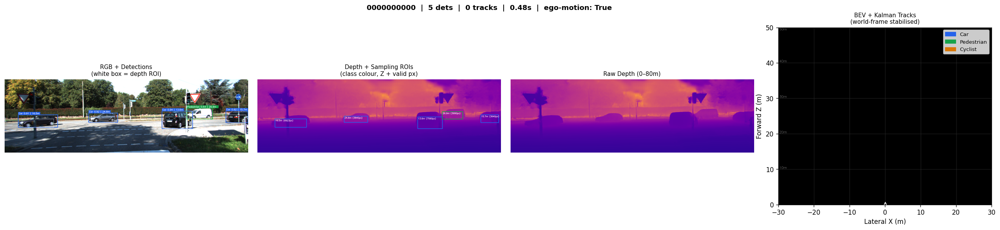

  0000000001_bev.png


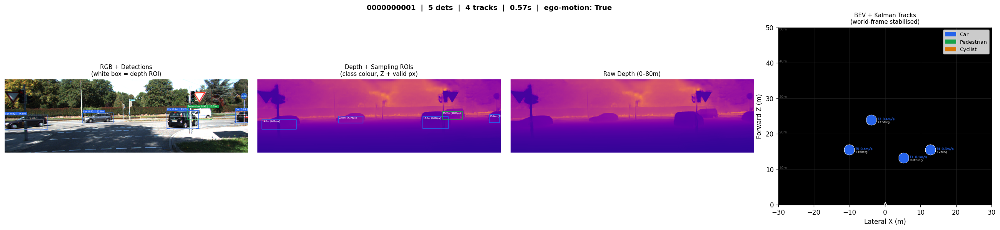

  0000000002_bev.png


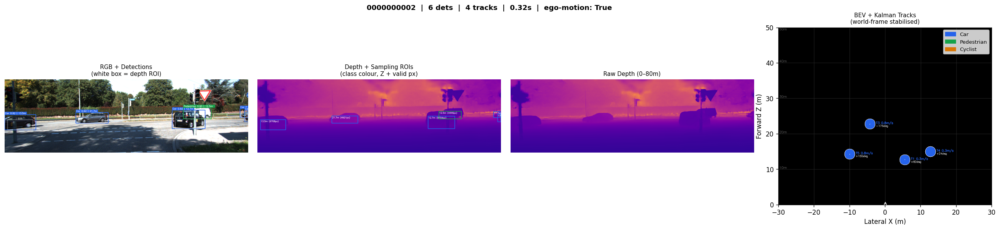

  0000000003_bev.png


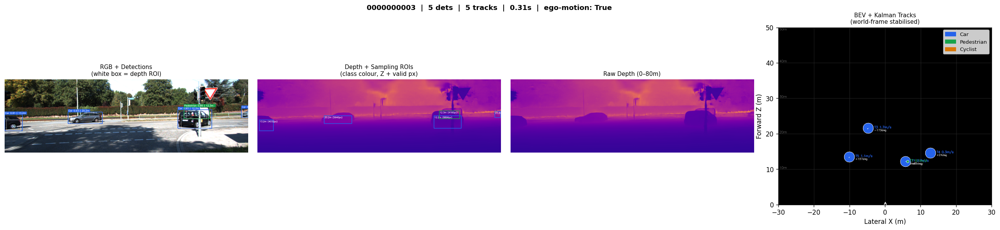

  0000000004_bev.png


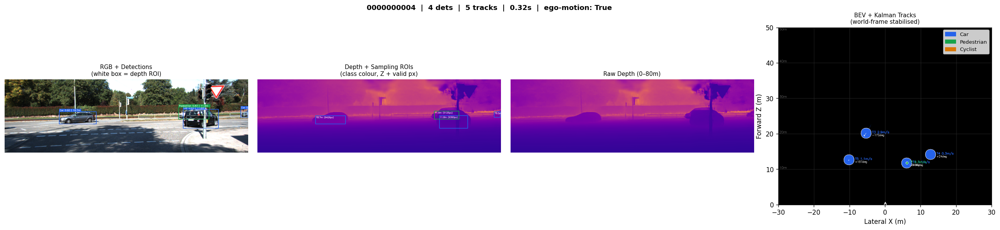

  0000000005_bev.png


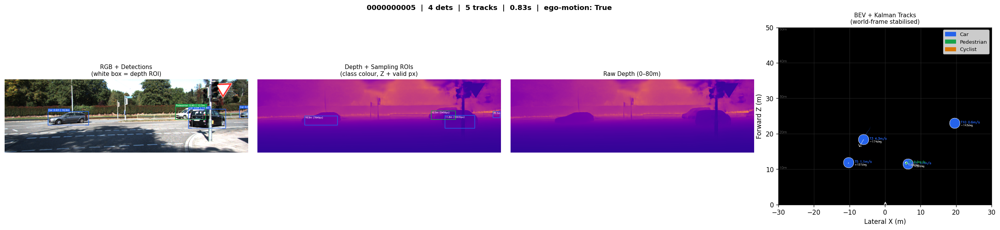

  0000000006_bev.png


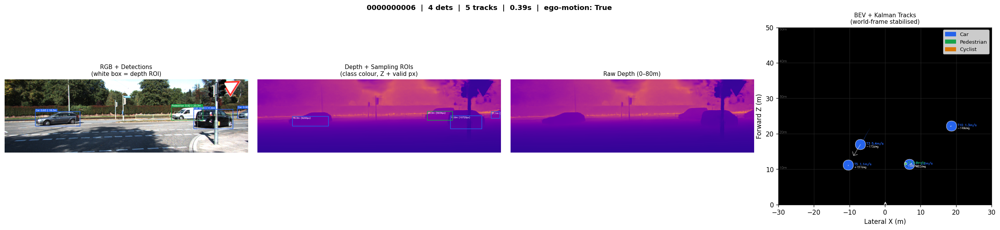

  0000000007_bev.png


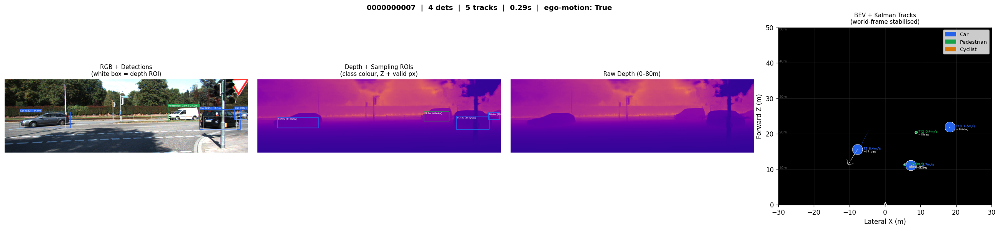

  0000000008_bev.png


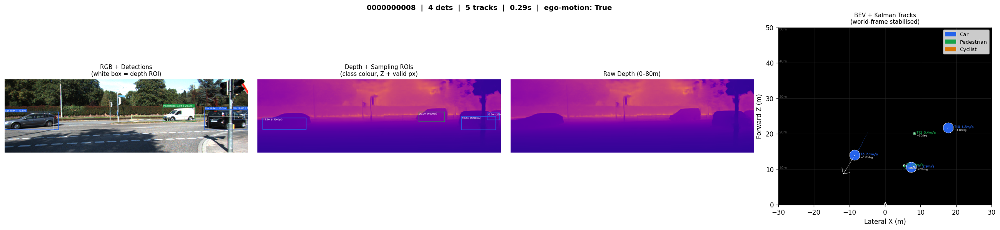

  0000000009_bev.png


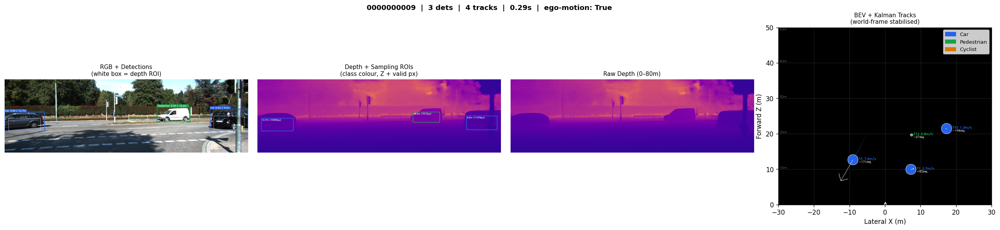

  0000000010_bev.png


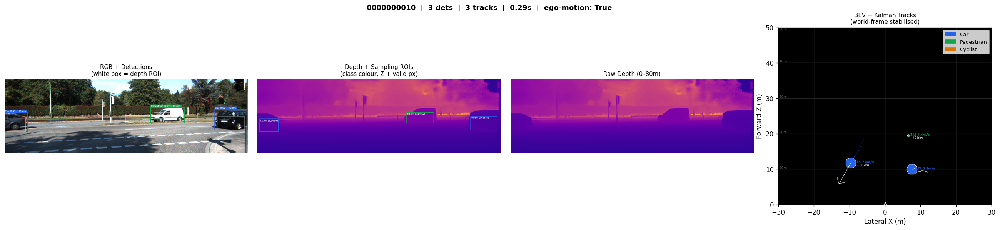

  0000000011_bev.png


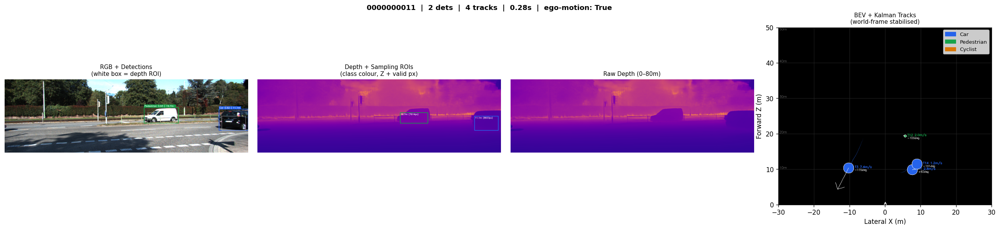

  0000000012_bev.png


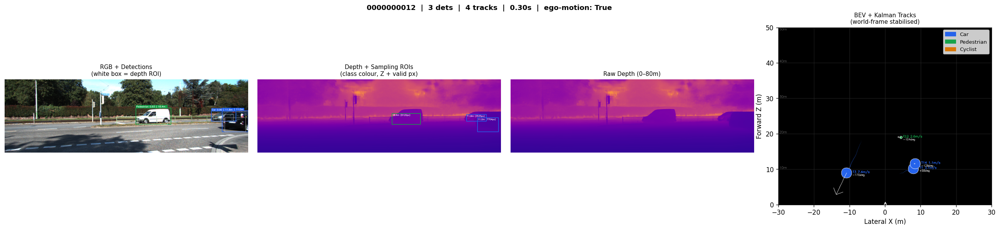

  0000000013_bev.png


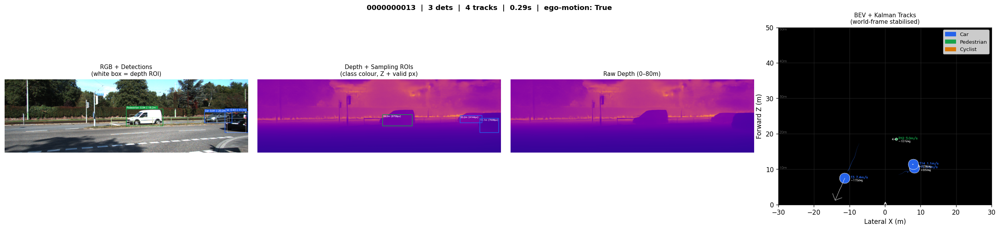

  0000000014_bev.png


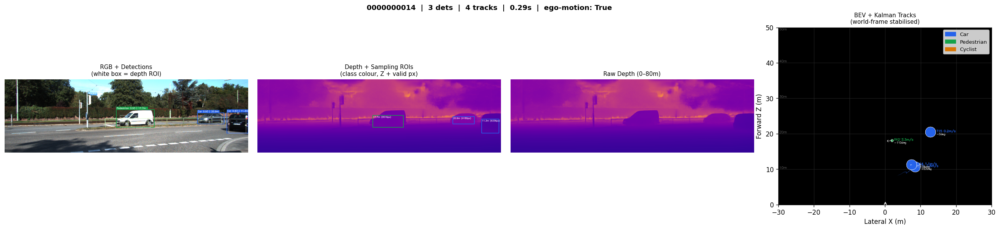

  0000000015_bev.png


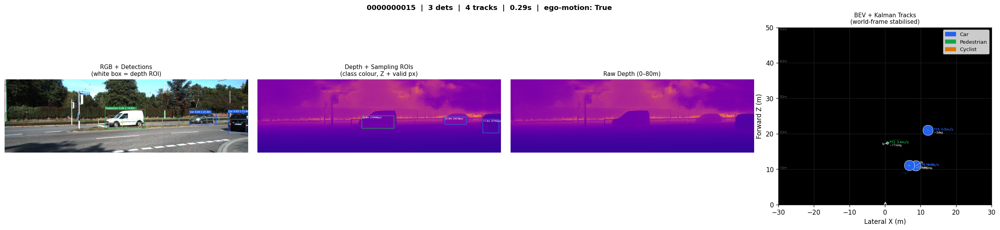

  0000000016_bev.png


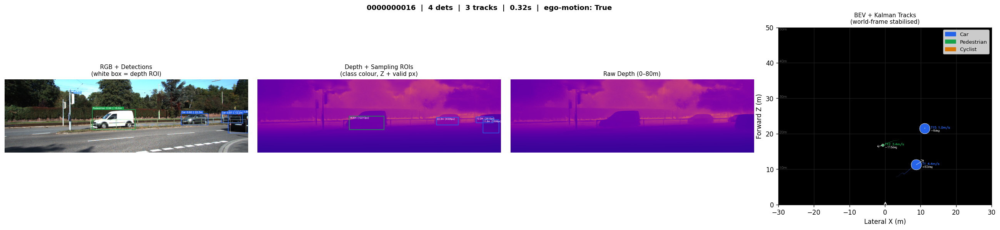

  0000000017_bev.png


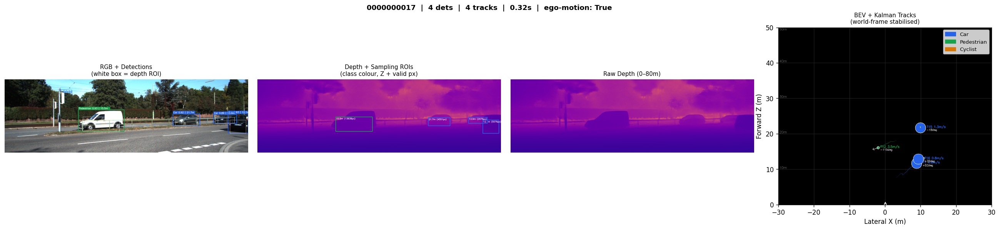

  0000000018_bev.png


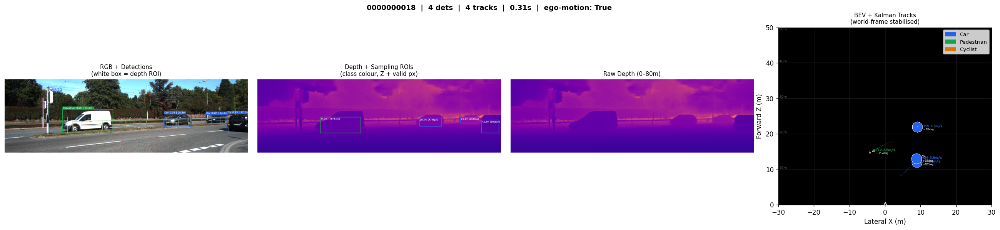

  0000000019_bev.png


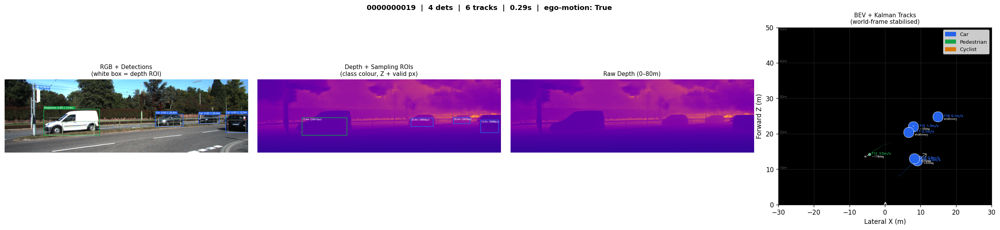

In [22]:
from IPython.display import display, Image as IPImage
import glob as _glob

composite_files = sorted(_glob.glob(f'{LOCAL_OUT_DIR}/{SEQUENCE_ID}/*_bev.png'))[:20]
print(f'Displaying {len(composite_files)} composite frames:')
for path in composite_files:
    print(f'  {os.path.basename(path)}')
    display(IPImage(path, width=1100))

## 8. Evaluation

Per Frame Statistics

In [31]:
import numpy as np

if not frame_stats:
    print('No frames processed yet. Run the main loop first.')
else:
    total_dets = sum(s['n_det'] for s in frame_stats)
    avg_time   = np.mean([s['elapsed_s'] for s in frame_stats])
    sep = '-' * 60
    print(sep)
    print('BEV FUSION SUMMARY')
    print(sep)
    print(f'  Frames processed     : {len(frame_stats)}')
    print(f'  Total detections     : {total_dets}')
    print(f'  Avg detections/frame : {total_dets/len(frame_stats):.1f}')
    print(f'  Avg time/frame       : {avg_time:.2f}s')
    print(f'  Effective FPS        : {1/avg_time:.2f}')
    print(f'  Ego-motion enabled   : {EGO_MOTION_AVAILABLE}')
    print(sep)

    class_counts   = {n:0 for n in CLASS_NAMES.values()}
    depth_by_class = {n:[] for n in CLASS_NAMES.values()}
    for s in frame_stats:
        for det in s['detections']:
            name = CLASS_NAMES.get(det['cls_id'], 'Unknown')
            class_counts[name]    += 1
            depth_by_class[name].append(det['Z_cam'])

    print(f'  {"Class":<14} {"Count":>7} {"Avg depth(m)":>14} {"Min depth(m)":>14}')
    print(f'  {"-"*52}')
    for name in CLASS_NAMES.values():
        depths = depth_by_class[name]
        avd = np.mean(depths) if depths else 0.0
        mid = np.min(depths)  if depths else 0.0
        print(f'  {name:<14} {class_counts[name]:>7} {avd:>14.1f} {mid:>14.1f}')
    print(sep)

    all_tracks = [t for s in frame_stats for t in s.get('tracks', [])]
    if all_tracks:
        speeds    = [t['speed_ms'] for t in all_tracks]
        track_ids = set(t['track_id'] for t in all_tracks)
        print(f'\nKINEMATIC SUMMARY')
        print(f'  Unique track IDs : {len(track_ids)}')
        print(f'  Avg speed        : {np.mean(speeds):.3f} m/s')
        print(f'  Max speed        : {np.max(speeds):.3f} m/s')
        print(sep)

------------------------------------------------------------
BEV FUSION SUMMARY
------------------------------------------------------------
  Frames processed     : 50
  Total detections     : 262
  Avg detections/frame : 5.2
  Avg time/frame       : 0.37s
  Effective FPS        : 2.67
  Ego-motion enabled   : True
------------------------------------------------------------
  Class            Count   Avg depth(m)   Min depth(m)
  ----------------------------------------------------
  Car                238           24.8            7.4
  Pedestrian          24           15.9            8.2
  Cyclist              0            0.0            0.0
------------------------------------------------------------

KINEMATIC SUMMARY
  Unique track IDs : 31
  Avg speed        : 2.162 m/s
  Max speed        : 8.072 m/s
------------------------------------------------------------


Download Ground Truth Data

In [32]:
import subprocess, zipfile, os

if not GT_LABEL_FILE.exists():
    print('GT labels not found, downloading (~2 MB) ...')
    ret = subprocess.run(
        ['wget', '-q', '--show-progress', '--tries=3',
         'https://s3.eu-central-1.amazonaws.com/avg-kitti/data_tracking_label_2.zip',
         '-O', '/content/tracking_labels.zip'],
        check=False
    )
    if ret.returncode == 0:
        GT_LABEL_FILE.parent.mkdir(parents=True, exist_ok=True)
        with zipfile.ZipFile('/content/tracking_labels.zip', 'r') as z:
            z.extractall('/content/kitti_tracking')
        os.remove('/content/tracking_labels.zip')
    else:
        print('Download failed. Evaluation will fall back to self-consistency mode.')

GT_AVAILABLE = GT_LABEL_FILE.exists()
print(f'GT labels: {"available" if GT_AVAILABLE else "NOT available"}  |  {GT_LABEL_FILE}')

GT labels: available  |  /content/kitti_tracking/training/label_02/0004.txt


In [33]:
from collections import defaultdict, Counter

def parse_kitti_tracking_labels(label_file, max_frames=None):
    gt = defaultdict(list)
    with open(label_file) as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 17:
                continue
            frame_idx = int(parts[0])
            if max_frames and frame_idx >= max_frames:
                continue
            obj_type = parts[2]
            if obj_type not in GT_CLASS_MAP:
                continue
            gt[frame_idx].append({
                'track_id': int(parts[1]),
                'cls_id': GT_CLASS_MAP[obj_type],
                'x_cam': float(parts[13]),
                'z_cam': float(parts[15]),
                'h': float(parts[10]),
                'w': float(parts[11]),
                'l': float(parts[12]),
                'occluded': int(parts[4]),
                'truncated': float(parts[3]),
            })
    return gt


if GT_AVAILABLE:
    gt_labels = parse_kitti_tracking_labels(GT_LABEL_FILE, max_frames=MAX_FRAMES)
    total_gt_objs = sum(len(v) for v in gt_labels.values())
    print(f'GT labels parsed: {len(gt_labels)} frames, {total_gt_objs} objects')
    cls_counter = Counter(CLASS_NAMES[o['cls_id']] for objs in gt_labels.values() for o in objs)
    for cls, cnt in cls_counter.most_common():
        print(f'  {cls:<14}: {cnt}')
else:
    gt_labels = {}

GT labels parsed: 50 frames, 269 objects
  Car           : 269


In [ ]:
import numpy as np

def circle_iou(cx1, cy1, r1, cx2, cy2, r2):
    d = np.sqrt((cx1 - cx2)**2 + (cy1 - cy2)**2)
    if d >= r1 + r2:
        return 0.0
    if d <= abs(r1 - r2):
        smaller, larger = min(r1, r2), max(r1, r2)
        return (np.pi * smaller**2) / (np.pi * larger**2)
    alpha = np.arccos((d**2 + r1**2 - r2**2) / (2 * d * r1))
    beta = np.arccos((d**2 + r2**2 - r1**2) / (2 * d * r2))
    inter = r1**2 * alpha + r2**2 * beta - r1**2 * np.sin(2*alpha)/2 - r2**2 * np.sin(2*beta)/2
    union = np.pi * r1**2 + np.pi * r2**2 - inter
    return max(float(inter / (union + 1e-8)), 0.0)


def gt_radius_m(obj):
    # Use actual GT box dimensions rather than fixed per-class value
    return max(obj['w'], obj['l']) / 2.0


def match_detections_to_gt(pred_list, gt_list, max_match_dist_m=5.0):
    if not pred_list or not gt_list:
        return [], list(range(len(pred_list))), list(range(len(gt_list)))

    n_pred, n_gt = len(pred_list), len(gt_list)
    score_matrix = np.zeros((n_pred, n_gt))
    iou_matrix = np.zeros((n_pred, n_gt))
    err_matrix = np.full((n_pred, n_gt), np.inf)

    for i, p in enumerate(pred_list):
        r_pred = CLASS_RADIUS_M.get(p['cls_id'], 1.0)
        for j, g in enumerate(gt_list):
            if p['cls_id'] != g['cls_id']:
                continue
            err = np.sqrt((p['x_cam'] - g['x_cam'])**2 + (p['z_cam'] - g['z_cam'])**2)
            if err > max_match_dist_m:
                continue
            iou = circle_iou(p['x_cam'], p['z_cam'], r_pred, g['x_cam'], g['z_cam'], gt_radius_m(g))
            iou_matrix[i, j] = iou
            err_matrix[i, j] = err
            score_matrix[i, j] = iou + 0.5 * (1.0 - err / max_match_dist_m)

    matched_pairs = []
    unmatched_preds, unmatched_gts = set(range(n_pred)), set(range(n_gt))

    for idx in np.argsort(-score_matrix.ravel()):
        i, j = divmod(idx, n_gt)
        if score_matrix[i, j] < 0.05:
            break
        if i not in unmatched_preds or j not in unmatched_gts:
            continue
        matched_pairs.append((pred_list[i], gt_list[j], float(iou_matrix[i, j]), float(err_matrix[i, j])))
        unmatched_preds.remove(i)
        unmatched_gts.remove(j)

    return matched_pairs, list(unmatched_preds), list(unmatched_gts)

In [35]:
EVAL_CLS = {0}

val_results = []

for s in frame_stats:
    frame_idx = int(s['frame'])

    preds = [
        {'x_cam': det['X_cam'], 'z_cam': det['Z_cam'], 'cls_id': det['cls_id'], 'conf': det['conf']}
        for det in s['detections'] if det['cls_id'] in EVAL_CLS
    ]

    gt_objs = []
    if GT_AVAILABLE and frame_idx in gt_labels:
        gt_objs = [
            g for g in gt_labels[frame_idx]
            if g['cls_id'] in EVAL_CLS
            and g['occluded'] < 2 and g['truncated'] <= 0.5
            and g['z_cam'] <= BEV_RANGE_Z and abs(g['x_cam']) <= BEV_RANGE_X
        ]

    if GT_AVAILABLE and gt_objs:
        matched, unmatched_p, unmatched_g = match_detections_to_gt(preds, gt_objs)
        tp, fp, fn = len(matched), len(unmatched_p), len(unmatched_g)
        ious = [m[2] for m in matched]
        errs = [m[3] for m in matched]
        mean_iou = float(np.mean(ious)) if ious else 0.0
        mean_err = float(np.mean(errs)) if errs else None
    else:
        matched, tp, fp, fn = [], 0, 0, 0
        mean_iou, mean_err = None, None

    depth_warnings = sum(1 for d in s['detections'] if d['cls_id'] in EVAL_CLS and d['Z_cam'] > 40.0)

    val_results.append({
        'frame': s['frame'],
        'frame_idx': frame_idx,
        'n_det': len(preds),
        'n_gt': len(gt_objs),
        'tp': tp, 'fp': fp, 'fn': fn,
        'mean_iou': mean_iou,
        'mean_err_m': mean_err,
        'matched': matched,
        'unmatched_p': unmatched_p,
        'unmatched_g': unmatched_g,
        'depth_warnings': depth_warnings,
        'tracks': s['tracks'],
    })

print(f'Evaluated {len(val_results)} frames  |  classes: {[CLASS_NAMES[c] for c in EVAL_CLS]}')
if GT_AVAILABLE:
    valid = [r for r in val_results if r['mean_iou'] is not None]
    print(f'  Frames with GT matches: {len(valid)}')
    if valid:
        print(f'  Mean BEV IoU          : {np.mean([r["mean_iou"] for r in valid]):.3f}')
        errs = [r["mean_err_m"] for r in valid if r["mean_err_m"] is not None]
        if errs:
            print(f'  Mean placement error  : {np.mean(errs):.2f} m')

Evaluated 50 frames  |  classes: ['Car']
  Frames with GT matches: 50
  Mean BEV IoU          : 0.321
  Mean placement error  : 1.45 m


In [ ]:
total_tp = sum(r['tp'] for r in val_results)
total_fp = sum(r['fp'] for r in val_results)
total_fn = sum(r['fn'] for r in val_results)
precision = total_tp / (total_tp + total_fp + 1e-8)
recall = total_tp / (total_tp + total_fn + 1e-8)
f1 = 2 * precision * recall / (precision + recall + 1e-8)
all_ious = [m[2] for r in val_results for m in r['matched']]
all_errs = [m[3] for r in val_results for m in r['matched']]

sep = '=' * 65
print(sep)
print('BEV VALIDATION REPORT')
print(sep)
print(f'  Frames evaluated  : {len(val_results)}')
print(f'  Total GT objects  : {sum(r["n_gt"] for r in val_results)}')
print(f'  Total detections  : {sum(r["n_det"] for r in val_results)}')
print(f'  TP: {total_tp}  FP: {total_fp}  FN: {total_fn}')
print()

if GT_AVAILABLE:
    print(f'  Precision : {precision:.3f}')
    print(f'  Recall    : {recall:.3f}')
    print(f'  F1        : {f1:.3f}')
    print()
    if all_ious:
        print(f'  Mean BEV IoU           : {np.mean(all_ious):.3f}')
        print(f'  Median BEV IoU         : {np.median(all_ious):.3f}')
        print(f'  IoU >= 0.25 (strict)   : {sum(iou >= 0.25 for iou in all_ious)}/{len(all_ious)}')
    if all_errs:
        print(f'  Mean placement error   : {np.mean(all_errs):.2f} m')
        print(f'  Median placement error : {np.median(all_errs):.2f} m')
        print(f'  P90 placement error    : {np.percentile(all_errs, 90):.2f} m')
    print()

    if all_ious:
        print(f'  {"Class":<14} {"TP":>4} {"FP":>4} {"FN":>4} {"mIoU":>7} {"mErr(m)":>9}')
        print(f'  {"-"*48}')
        for cls_id, cls_name in CLASS_NAMES.items():
            cls_matches = [m for r in val_results for m in r['matched'] if m[0]['cls_id'] == cls_id]
            cls_tp = len(cls_matches)
            # FP: unmatched preds of this class
            cls_fp = sum(1 for r in val_results for i in r['fp_indices'] if val_results[0]['n_det'] > 0
                        ) if 'fp_indices' in val_results[0] else max(0, sum(
                            1 for s in frame_stats for d in s['detections'] if d['cls_id'] == cls_id
                        ) - cls_tp)
            # FN: unmatched GT of this class using same thresholds as Cell 15
            cls_fn = max(0, sum(
                1 for r in val_results
                for g in gt_labels.get(r['frame_idx'], [])
                if g['cls_id'] == cls_id
                and g['occluded'] < 2 and g['truncated'] <= 0.5
                and g['z_cam'] <= BEV_RANGE_Z and abs(g['x_cam']) <= BEV_RANGE_X
            ) - cls_tp)
            iou_str = f'{np.mean([m[2] for m in cls_matches]):.3f}' if cls_matches else 'N/A'
            err_str = f'{np.mean([m[3] for m in cls_matches]):.2f}' if cls_matches else 'N/A'
            print(f'  {cls_name:<14} {cls_tp:>4} {max(cls_fp,0):>4} {cls_fn:>4} {iou_str:>7} {err_str:>9}')

print(sep)

BEV VALIDATION REPORT
  Frames evaluated  : 50
  Total GT objects  : 199
  Total detections  : 238
  TP: 172  FP: 66  FN: 27

  Precision : 0.723
  Recall    : 0.864
  F1        : 0.787

  Mean BEV IoU           : 0.334
  Median BEV IoU         : 0.374
  IoU >= 0.25 (strict)   : 106/172
  Mean placement error   : 1.42 m
  Median placement error : 1.18 m
  P90 placement error    : 2.80 m

  Class            TP   FP   FN    mIoU   mErr(m)
  ------------------------------------------------
  Car             172   66   27   0.334      1.42
  Pedestrian        0   24    0     N/A       N/A
  Cyclist           0    0    0     N/A       N/A


## Save Evaluation Results

These graphs and evaluation statistics are available under `bev_outputs\SEQUENCE_ID\results`

In [ ]:
(LOCAL_OUT_DIR / SEQUENCE_ID / 'results').mkdir(parents=True, exist_ok=True)

Per Frame Plots of BEV IoU and Object Placement Error

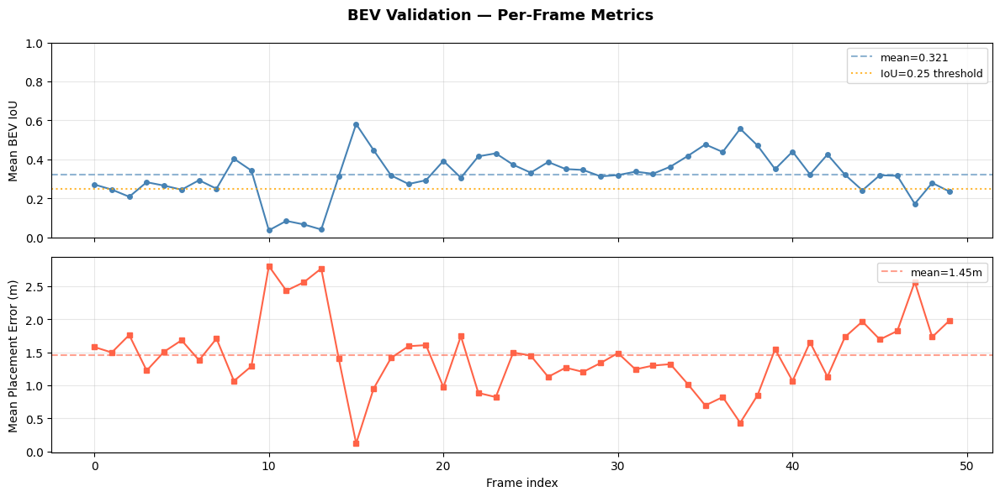

Saved to /content/bev_outputs/0004/bev_validation_metrics.png


In [ ]:
import matplotlib.pyplot as plt

if GT_AVAILABLE:
    frames_with_gt = [r for r in val_results if r['mean_iou'] is not None]
    if not frames_with_gt:
        print('No matched GT objects to plot.')
    else:
        xs = [r['frame_idx'] for r in frames_with_gt]
        ious = [r['mean_iou'] for r in frames_with_gt]
        errs = [r['mean_err_m'] if r['mean_err_m'] is not None else 0.0 for r in frames_with_gt]

        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
        fig.suptitle('BEV Validation — Per-Frame Metrics', fontsize=13, fontweight='bold')

        ax1.plot(xs, ious, 'o-', color='steelblue', markersize=4, linewidth=1.5)
        ax1.axhline(np.mean(ious), color='steelblue', linestyle='--', alpha=0.6, label=f'mean={np.mean(ious):.3f}')
        ax1.axhline(0.25, color='orange', linestyle=':', alpha=0.8, label='IoU=0.25 threshold')
        ax1.set_ylabel('Mean BEV IoU')
        ax1.set_ylim(0, 1)
        ax1.legend(fontsize=9)
        ax1.grid(True, alpha=0.3)

        ax2.plot(xs, errs, 's-', color='tomato', markersize=4, linewidth=1.5)
        ax2.axhline(np.mean(errs), color='tomato', linestyle='--', alpha=0.6, label=f'mean={np.mean(errs):.2f}m')
        ax2.set_ylabel('Mean Placement Error (m)')
        ax2.set_xlabel('Frame index')
        ax2.legend(fontsize=9)
        ax2.grid(True, alpha=0.3)

        plt.tight_layout()
        plot_path = LOCAL_OUT_DIR / SEQUENCE_ID / 'results/bev_validation_metrics.png'
        plt.savefig(plot_path, dpi=120, bbox_inches='tight')
        plt.show()
        print(f'Saved to {plot_path}')

else:
    speed_limits = [20.0, 3.5]
    track_lifetimes = {}
    for s in frame_stats:
        for tr in s['tracks']:
            track_lifetimes[tr['track_id']] = track_lifetimes.get(tr['track_id'], 0) + 1
    lifetimes = list(track_lifetimes.values())
    all_speeds = [tr['speed_ms'] for s in frame_stats for tr in s['tracks']]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    fig.suptitle('Self-Consistency Validation (no GT)', fontsize=13, fontweight='bold')

    if all_speeds:
        ax1.hist(all_speeds, bins=30, color='steelblue', edgecolor='white', linewidth=0.5)
        ax1.axvline(speed_limits[0], color='tomato', linestyle='--', label=f'Car limit {speed_limits[0]}m/s')
        ax1.axvline(speed_limits[1], color='green', linestyle='--', label=f'Ped limit {speed_limits[1]}m/s')
        ax1.set_xlabel('Speed (m/s)')
        ax1.set_ylabel('Count')
        ax1.set_title('Track speed distribution')
        ax1.legend(fontsize=8)

    if lifetimes:
        ax2.hist(lifetimes, bins=range(1, max(lifetimes) + 2), color='mediumpurple', edgecolor='white', linewidth=0.5, align='left')
        ax2.set_xlabel('Track lifetime (frames)')
        ax2.set_ylabel('Count')
        ax2.set_title('Track longevity distribution')

    plt.tight_layout()
    plot_path = LOCAL_OUT_DIR / SEQUENCE_ID / 'results/bev_self_consistency.png'
    plt.savefig(plot_path, dpi=120, bbox_inches='tight')
    plt.show()
    print(f'Saved to {plot_path}')

Save per frame statistics to a csv

In [ ]:
import csv

csv_path = LOCAL_OUT_DIR / SEQUENCE_ID / 'results/per_frame_metrics.csv'

with open(csv_path, 'w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow([
        'frame_idx', 'n_det', 'n_tracks', 'elapsed_s',
        'tp', 'fp', 'fn', 'n_gt',
        'mean_iou', 'mean_err_m'
    ])
    for s, v in zip(frame_stats, val_results):
        writer.writerow([
            v['frame_idx'],
            s['n_det'],
            s['n_tracks'],
            round(s['elapsed_s'], 4),
            v['tp'],
            v['fp'],
            v['fn'],
            v['n_gt'],
            round(v['mean_iou'], 4)   if v['mean_iou']   is not None else '',
            round(v['mean_err_m'], 4) if v['mean_err_m'] is not None else '',
        ])

print(f'Saved per-frame metrics to {csv_path}')

Save processed frames to gif (object detection, depth detection, and bev views)

In [ ]:
from PIL import Image as PILImage
import glob, os

out_dir = LOCAL_OUT_DIR / SEQUENCE_ID
gif_path = out_dir / f'results/bev_stacked_{SEQUENCE_ID}.gif'

rgb_paths   = sorted(glob.glob(str(out_dir / '*_rgb_det.png')))
depth_paths = sorted(glob.glob(str(out_dir / '*_depth_roi.png')))
bev_paths   = sorted(glob.glob(str(out_dir / '*_bev_only.png')))

assert len(rgb_paths) == len(depth_paths) == len(bev_paths), \
    "Mismatch in number of saved frames — re-run the main loop first."

frames = []
for rgb_p, depth_p, bev_p in zip(rgb_paths, depth_paths, bev_paths):
    rgb   = PILImage.open(rgb_p).convert('RGB')
    depth = PILImage.open(depth_p).convert('RGB')
    bev   = PILImage.open(bev_p).convert('RGB')

    W = rgb.width
    depth = depth.resize((W, int(depth.height * W / depth.width)), PILImage.LANCZOS)
    bev   = bev.resize((W, int(bev.height   * W / bev.width)),   PILImage.LANCZOS)

    H = rgb.height + depth.height + bev.height
    canvas = PILImage.new('RGB', (W, H), (20, 20, 20))
    canvas.paste(rgb,   (0, 0))
    canvas.paste(depth, (0, rgb.height))
    canvas.paste(bev,   (0, rgb.height + depth.height))
    frames.append(canvas)

frames[0].save(
    gif_path,
    save_all=True,
    append_images=frames[1:],
    duration=150,
    loop=0,
)
print(f'Saved GIF ({len(frames)} frames): {gif_path}')